# __Tugas Besar 1 Pembelajaran Mesin__

Group Name: Kelompok 27 - CapCipCup

Group Member:
- Jonathan Emmanuel Saragih (13522121)
- Jason Fernando (13522156)
- Bryan P. Hutagalung (18222130)

# __Table of Contents__
- [A. Import Libraries and Modules](#a-import-libraries-and-modules)
  - [1. Import Libraries](#1-import-libraries)
  - [2. Import Modules](#2-import-modules)
- [B. Load and Prepare Dataset](#b-load-and-prepare-dataset)
  - [1. Load MNIST Dataset](#1-load-mnist-dataset)
  - [2. Prepare MNIST Dataset](#2-prepare-mnist-dataset)
  - [3. Visualize MNIST Dataset](#3-visualize-mnist-dataset)
- [C. Neural Network Implementation](#c-neural-network-implementation)
  - [1. Base Model](#1-base-model)
  - [2. Train Model](#2-train-model)
  - [3. Result History](#3-result-history)
  - [4. Compile Function](4-compile-function)
- [D. Hidden Layer Depth and Width](#d-hidden-layer-depth-and-width)
  - [1. Depth 1: 3 Layer](#1-depth-1-3-layer)
  - [2. Depth 2: 5 Layer](#2-depth-2-5-layer)
  - [3. Depth 3: 7 Layer](#3-depth-3-7-layer)
  - [Compare Hidden Layer Depth and Width](#compare-hidden-layer-depth-and-width)
- [E. Hidden Layer Activation Function](#e-hidden-layer-activation-function)
  - [1. Linear](#1-linear)
  - [2. ReLU](#2-relu)
  - [3. Sigmoid](#3-sigmoid)
  - [4. TanH](#4-tanh)
  - [5. Softmax](#5-softmax)
  - [6. Softplus](#6-softplus)
  - [7. ELU](#7-elu)
  - [Compare Hidden Layer Activation Function](#compare-hidden-layer-activation-function)
- [F. Output Layer Activation Function](#f-output-layer-activation-function)
  - [1. Sigmoid](#1-sigmoid)
  - [2. Softmax](#2-softmax)
  - [Compare Output Layer Activation Function](#compare-output-layer-activation-function)
- [G. Learning Rate](#g-learning-rate)
  - [1. 0.01](#1-001)
  - [2. 0.001](#2-0001)
  - [3. 0.0001](#3-00001)
  - [Compare Learning Rate](#compare-learning-rate)
- [H. Loss Function](#h-loss-function)
  - [1. Mean Squared Error](#1-mean-squared-error)
  - [2. BCE](#2-bce)
  - [3. CCE](#3-cce)
  - [Compare Loss Function](#compare-loss-function)
- [I. Weight Initialization](#i-weight-initialization)
  - [1. Zero](#1-zero)
  - [2. Random Uniform](#2-random-uniform)
  - [3. Random Normal](#3-random-normal)
  - [4. Xavier Uniform](#4-xavier-uniform)
  - [5. He Uniform](#5-he-uniform)
  - [Compare Weight Initialization](#compare-weight-initialization)
- [J. Regularization](#j-regularization)
  - [1. None](#1-none)
  - [2. L1](#2-l1)
  - [3. L2](#3-l2)
  - [Compare Regularization](#compare-regularization)
- [K. Normalization](#k-normalization)
  - [1. None](#1-none)
  - [2. Batch Normalization](#2-batch-normalization)
  - [3. Layer Normalization](#3-layer-normalization)
  - [Compare Normalization](#compare-normalization)
- [L. Comparison with Library](#l-comparison-with-library)
  - [1. Scratch Model](#1-scratch-model)
  - [2. Library Model](#2-library-model)
  - [Compare CapCipCup Scratch vs MLP Library](#compare-capcipcup-scratch-vs-mlp-library)
- [M. Save and Load CapCipCup Model](#m-save-and-load-capcipcup-model)
  - [1. Save Model](#1-save-model)
  - [2. Load Model](#2-load-model)

## A. Import Libraries and Modules

- **Import Libraries**

- **Import Modules**

### 1. Import Libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import os
import time

from sklearn.datasets import fetch_openml
from sklearn.preprocessing import OneHotEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix

np.random.seed(42)

%matplotlib inline
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

### 2. Import Modules

In [3]:
import sys
sys.path.append('..')

from src.core.activations import Linear, ReLU, Sigmoid, Tanh, Softmax, Softplus, ELU
from src.core.loss_functions import MeanSquaredError, BinaryCrossEntropy, CategoricalCrossEntropy
from src.core.neural_network import NeuralNetwork
from src.core.layers import Layer, DenseLayer, RMSNormalizationLayer
from src.util.visualization import (
    visualize_model_performance, visualize_model_weights_and_gradients,
    compare_models_performance, compare_per_class_accuracy
)
from src.train.trainer import train_test_split, Trainer, EarlyStopping, LearningRateScheduler
from src.train.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

## B. Load and Prepare Dataset

- **Load MNIST Dataset**

- **Prepare MNIST Dataset**

- **Visualize MNIST Dataset**

### 1. Load MNIST Dataset

In [4]:
def load_mnist_data():
    """Load MNIST dataset and prepare it for training."""
    X, y = fetch_openml('mnist_784', version=1, return_X_y=True, parser='auto')
    
    if hasattr(X, 'values'):
        X = X.values
    if hasattr(y, 'values'):
        y = y.values
    
    X = X.astype('float32')
    y = y.astype('int')
    
    X = X / 255.0
    
    return X, y

In [5]:
print("Loading MNIST dataset...")
X, y = load_mnist_data()

Loading MNIST dataset...


### 2. Prepare MNIST Dataset

In [6]:
def prepare_mnist_data(X, y, num_samples, test_size=0.2):
    """Prepare MNIST data for training and testing."""
    X_train, X_test, y_train_raw, y_test_raw = train_test_split(
        X, y, test_size=test_size, random_state=42
        )
    
    try:
        encoder = OneHotEncoder(sparse_output=False)
    except TypeError:
        encoder = OneHotEncoder(sparse=False)
        
    y_train_encoded = encoder.fit_transform(y_train_raw.reshape(-1, 1))
    y_test_encoded = encoder.transform(y_test_raw.reshape(-1, 1))
    
    return X_train, X_test, y_train_encoded, y_test_encoded, y_train_raw, y_test_raw

In [7]:
print("Preparing MNIST dataset...")
X_train, X_test, y_train, y_test, y_train_raw, y_test_raw = prepare_mnist_data(
    X, y, num_samples=70000, test_size=0.2
)
print(f"Loaded {len(X_train)} training samples and {len(X_test)} test samples.")
print(f"Input shape: {X_train.shape[1]} features, Output shape: {y_train.shape[1]} classes")

small_X_train = X_train[:X_train.shape[0] // 10]
small_y_train = y_train[:y_train.shape[0] // 10]
small_X_test = X_test[:X_test.shape[0] // 10]
small_y_test = y_test[:y_test.shape[0] // 10]
small_y_train_raw = y_train_raw[:len(y_train_raw) // 10]
small_y_test_raw = y_test_raw[:len(y_test_raw) // 10]

Preparing MNIST dataset...
Loaded 56000 training samples and 14000 test samples.
Input shape: 784 features, Output shape: 10 classes


### 3. Visualize MNIST Dataset

In [8]:
def visualize_mnist_samples(X, y, num_samples=10):
    """Visualize random samples from the MNIST dataset."""
    indices = np.random.choice(len(X), num_samples, replace=False)
    images = X[indices]
    labels = y[indices]
    
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 2))
    for i in range(num_samples):
        axs[i].imshow(images[i].reshape(28, 28), cmap='gray')
        axs[i].set_title(f"Label: {labels[i]}")
        axs[i].axis('off')
    
    plt.tight_layout()
    return fig

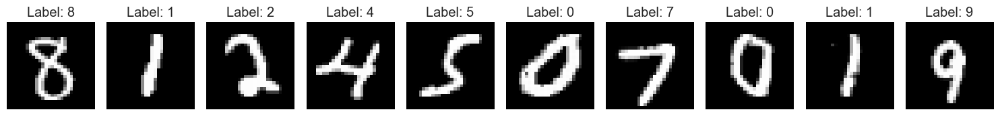

In [9]:
fig = visualize_mnist_samples(X_train, y_train_raw)
plt.show()

## C. Neural Network Implementation

- **Base Model**

- **Train Model**

- **Result History**

- **Compile Function**

### 1. Base Model

In [10]:
def create_base_model(
    input_size, 
    hidden_layers, 
    output_size,
    activation_functions,
    output_activation,
    learning_rate,
    loss_function,
    weight_initialization,
    regularization_type,
    normalization_type
):
    """Create a neural network with specified architecture and configuration."""
    layer_sizes = [input_size] + hidden_layers + [output_size]
    
    activation_mapping = {
        'linear': Linear(),
        'relu': ReLU(),
        'sigmoid': Sigmoid(),
        'tanh': Tanh(),
        'softmax': Softmax(),
        'softplus': Softplus(),
        'elu': ELU()
    }
    
    activations = []
    for i in range(len(hidden_layers) + 1):
        if i < len(hidden_layers):
            act_fn = activation_functions
        else:
            act_fn = output_activation
            
        activations.append(activation_mapping.get(act_fn.lower()))
    
    model = NeuralNetwork(
        layer_sizes=layer_sizes,
        activation_functions=activations,
        weight_initialization=weight_initialization,
        seed=42
    )
    
    if regularization_type != 'none':
        _apply_regularization(model, regularization_type)
    
    if normalization_type != 'none':
        _apply_normalization(model, normalization_type, hidden_layers)
    
    return model

def _apply_regularization(model, regularization_type, lambda_val=None):
    """Apply regularization to model layers."""
    if lambda_val is None:
        if regularization_type.lower() == 'l1':
            lambda_val = 1e-7
        else:
            lambda_val = 1e-6 
    
    for i, layer in enumerate(model.layers):
        if hasattr(layer, 'weights'):
            if regularization_type.lower() == 'l1':
                layer.l1_lambda = lambda_val
                layer.l2_lambda = 0.0
            elif regularization_type.lower() == 'l2':
                layer.l1_lambda = 0.0
                layer.l2_lambda = lambda_val

def _apply_normalization(model, normalization_type, hidden_layers):
    """Apply normalization to model by inserting normalization layers."""
    if normalization_type.lower() == 'rms':
        new_layers = []
        layer_idx = 0
        
        for i, layer in enumerate(model.layers):
            new_layers.append(layer)
            
            if hasattr(layer, 'weights') and layer_idx < len(hidden_layers):
                rms_layer = RMSNormalizationLayer(input_size=layer.output_size)
                new_layers.append(rms_layer)
                layer_idx += 1
        
        model.layers = new_layers

### 2. Train Model

In [11]:
def train_model(
    model, 
    X_train, 
    y_train, 
    X_test, 
    y_test, 
    learning_rate,
    loss_function, 
    batch_size=64, 
    epochs=50,
    verbose=1,
    callbacks=None
):
    """Train a neural network model with specified hyperparameters."""
    loss_mapping = {
        'mean_squared_error': MeanSquaredError(),
        'binary_crossentropy': BinaryCrossEntropy(),
        'categorical_crossentropy': CategoricalCrossEntropy()
    }
    
    loss_function = loss_mapping.get(loss_function.lower())
    
    trainer = Trainer(
        model=model, 
        learning_rate=learning_rate,
        loss_function=loss_function,
        batch_size=batch_size, 
        epochs=epochs,
        verbose=verbose
    )
    
    if callbacks is None:
        callbacks = []
        
    if not any(isinstance(cb, EarlyStopping) for cb in callbacks):
        early_stopping = EarlyStopping(patience=5, min_delta=0.001)
        callbacks.append(early_stopping)
    
    print(f"Training model with learning_rate={learning_rate}, batch_size={batch_size}, epochs={epochs}")
    history = trainer.train(X_train, y_train, X_val=X_test, y_val=y_test, callbacks=callbacks)
    
    predictions = None
    accuracy = None
    if X_test is not None and y_test is not None:
        predictions = model.predict(X_test)
        accuracy = np.mean(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1))
        print(f"Test accuracy: {accuracy:.4f}")
    
    return model, history, predictions, accuracy

### 3. Result History

In [12]:
def evaluate_model_results(model, history, X_test=None, y_test=None, predictions=None, show_per_class=True):
    """Evaluate and organize model results for analysis."""
    
    results = {
        "model": model,
        "history": history,
    }
    
    if X_test is not None and y_test is not None:
        if predictions is None:
            predictions = model.predict(X_test)
        
        results["predictions"] = predictions
        results["accuracy"] = accuracy_score(y_test, predictions)
        
        # Convert to class indices for metrics calculation
        if y_test.ndim > 1 and y_test.shape[1] > 1:
            y_true = np.argmax(y_test, axis=1)
        else:
            y_true = y_test
            
        if predictions.ndim > 1 and predictions.shape[1] > 1:
            y_pred = np.argmax(predictions, axis=1)
        else:
            y_pred = predictions
        
        # Calculate weighted average metrics for multiclass
        try:
            # Try to get scalar metrics
            weighted_precision = precision_score(y_true, y_pred, average='weighted')
            weighted_recall = recall_score(y_true, y_pred, average='weighted')
            weighted_f1 = f1_score(y_true, y_pred, average='weighted')
            
            # Handle the case where results are still arrays
            if hasattr(weighted_precision, 'shape') and weighted_precision.shape:
                results["precision"] = weighted_precision.item() if weighted_precision.size == 1 else weighted_precision.mean()
            else:
                results["precision"] = weighted_precision
                
            if hasattr(weighted_recall, 'shape') and weighted_recall.shape:
                results["recall"] = weighted_recall.item() if weighted_recall.size == 1 else weighted_recall.mean()
            else:
                results["recall"] = weighted_recall
                
            if hasattr(weighted_f1, 'shape') and weighted_f1.shape:
                results["f1"] = weighted_f1.item() if weighted_f1.size == 1 else weighted_f1.mean()
            else:
                results["f1"] = weighted_f1
        except Exception as e:
            print(f"Warning: Error calculating metrics: {e}")
            # Fallback: use direct accuracy for all metrics
            results["precision"] = results["accuracy"]
            results["recall"] = results["accuracy"]
            results["f1"] = results["accuracy"]
        
        # Save per-class metrics separately if needed
        if show_per_class:
            try:
                results["class_precision"] = precision_score(y_true, y_pred, average=None)
                results["class_recall"] = recall_score(y_true, y_pred, average=None)
                results["class_f1"] = f1_score(y_true, y_pred, average=None)
            except Exception as e:
                print(f"Warning: Could not calculate per-class metrics: {e}")
        
        results["confusion_matrix"] = confusion_matrix(y_true, y_pred)
        
        # Print overall metrics
        print("\nModel Evaluation Results:")
        print(f"Accuracy: {results['accuracy']:.4f}")
        print(f"Precision: {results['precision']:.4f}")
        print(f"Recall: {results['recall']:.4f}")
        print(f"F1 Score: {results['f1']:.4f}")
        
        # Print per-class metrics if requested and available
        if show_per_class and "class_precision" in results:
            print("\nPer-class Metrics:")
            for i in range(len(results["class_precision"])):
                print(f"Class {i}: Precision={results['class_precision'][i]:.4f}, "
                      f"Recall={results['class_recall'][i]:.4f}, "
                      f"F1={results['class_f1'][i]:.4f}")
    
    return results

### 4. Compile Function

In [13]:
def run_hyperparameter(
    X_train, X_test, y_train, y_test,
    name,
    hidden_layers,         
    activation_functions,       
    output_activation,
    learning_rate,
    loss_function,
    weight_initialization,
    regularization_type,
    normalization_type,
    batch_size=32,
    epochs=50,
    verbose=1,
    lr_scheduler=True,
    callbacks=None
):
    """Run an experiment with specific hyperparameters and visualize results."""
    model = create_base_model(
        input_size=784,
        hidden_layers=hidden_layers,
        output_size=10,
        activation_functions=activation_functions,
        output_activation=output_activation, 
        learning_rate=learning_rate,
        loss_function=loss_function,
        weight_initialization=weight_initialization,
        regularization_type=regularization_type,
        normalization_type=normalization_type
    )
    
    print(f"\nTraining {name} model...")
    print(f"Architecture: {hidden_layers}, Activation: {activation_functions}, Output: {output_activation}")
    print(f"LR: {learning_rate}, Loss: {loss_function}, Weight: {weight_initialization}")
    if regularization_type != 'none': print(f"Regularize: {regularization_type}")
    if normalization_type != 'none': print(f"Normalize: {normalization_type}")
    
    if callbacks is None:
        callbacks = []
    
    if lr_scheduler:
        lr_scheduler = LearningRateScheduler(
            initial_lr=learning_rate,
            decay_rate=0.9,
            decay_steps=5 
        )
        callbacks.append(lr_scheduler)
        print(f"Using learning rate scheduler: initial_lr={learning_rate}, decay_rate=0.9, decay_steps=5")
    
    trained_model, history, predictions, accuracy = train_model(
        model=model, 
        X_train=X_train, 
        y_train=y_train,
        X_test=X_test, 
        y_test=y_test, 
        learning_rate=learning_rate, 
        loss_function=loss_function,
        batch_size=batch_size,
        epochs=epochs, 
        verbose=verbose,
        callbacks=callbacks
    )
    
    results = evaluate_model_results(trained_model, history, X_test, y_test, predictions)
    
    fig_history = visualize_model_performance(trained_model, history, f"{name}: Training History")
    plt.figure(fig_history.number)
    plt.show()
    
    fig_weights = visualize_model_weights_and_gradients(trained_model)
    plt.figure(fig_weights.number)
    plt.show()
    
    return trained_model, history, predictions, accuracy, results

## D. Hidden Layer Depth and Width

- **Depth 1**: 3 Layer <br> **Width 1**: 16, 64, 16

- **Depth 1**: 3 Layer <br> **Width 2**: 64, 16, 64

- **Depth 1**: 3 Layer <br> **Width 3**: 40, 40, 40

- **Depth 2**: 5 Layer <br> **Width 1**: 16, 64, 256, 64, 16

- **Depth 2**: 5 Layer <br> **Width 2**: 256, 64, 16, 64, 256

- **Depth 2**: 5 Layer <br> **Width 3**: 108, 108, 108, 108, 108

- **Depth 3**: 7 Layer <br> **Width 1**: 16, 64, 256, 1024, 256, 64, 16

- **Depth 3**: 7 Layer <br> **Width 2**: 1024, 256, 64, 16, 64, 256, 1024

- **Depth 3**: 7 Layer <br> **Width 3**: 314, 314, 314, 314, 314, 314, 314

### 1. Depth 1: 3 Layer, Width 1: 16 64, 16


Training Depth 3 Layer, Width 16-64-16 model...
Architecture: [16, 64, 16], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.2311 - val_loss: 2.1546oss: 2.2025
Epoch 2/50 - train_loss: 2.0845 - val_loss: 1.9928oss: 1.9957
Epoch 3/50 - train_loss: 1.9000 - val_loss: 1.7823oss: 1.4980
Epoch 4/50 - train_loss: 1.6865 - val_loss: 1.5819oss: 1.4507
Epoch 5/50 - train_loss: 1.5037 - val_loss: 1.4115oss: 1.5595
Epoch 6/50 - train_loss: 1.3538 - val_loss: 1.2667oss: 1.2010
Epoch 7/50 - train_loss: 1.2315 - val_loss: 1.1516oss: 1.3899
Epoch 8/50 - train_loss: 1.1190 - val_loss: 1.0443oss: 1.1956
Epoch 9/50 - train_loss: 1.0189 - val_loss: 0.9587oss: 0.6948
Epoch 10/50 - train_loss: 0.9349 - val_loss: 0.8872oss: 0.7392
Epoch 11/50 - train_loss: 0.8666 - val_loss: 0.8264oss: 0.6258
Epo

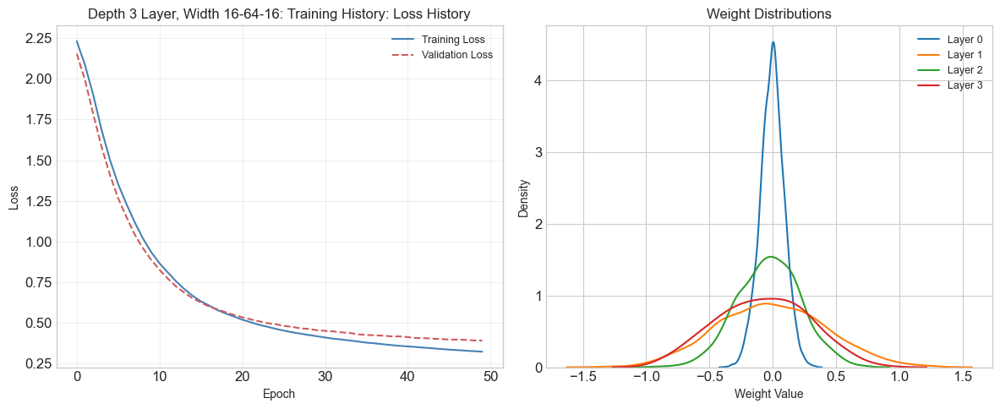

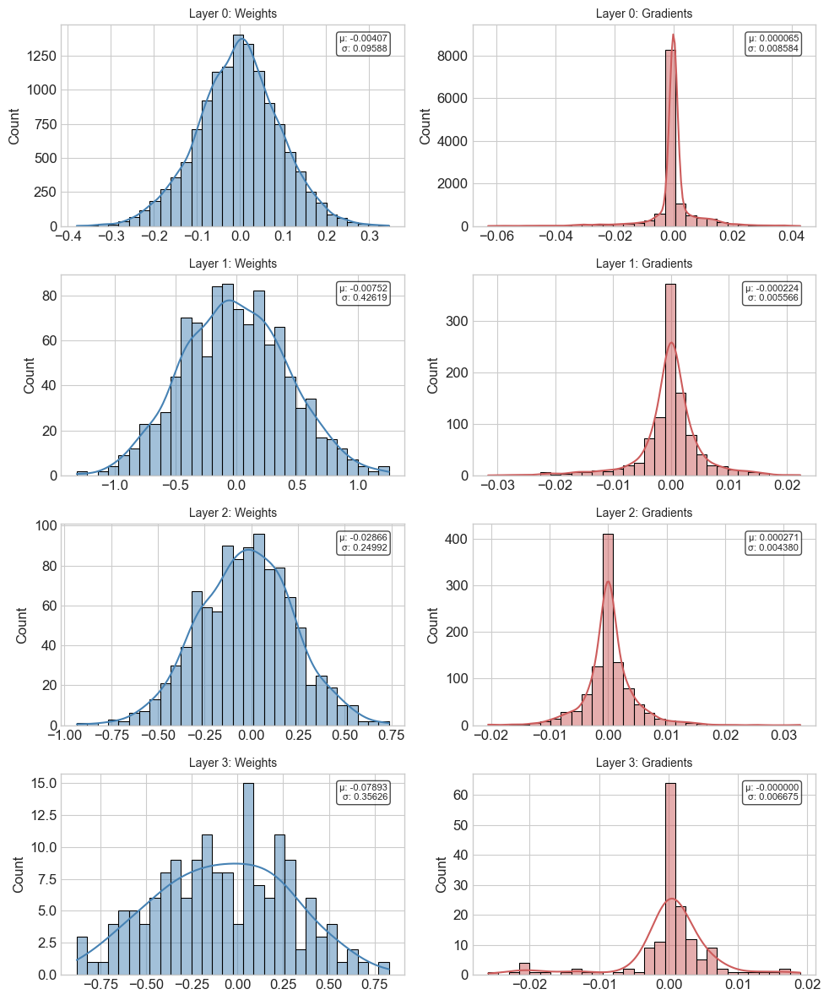

In [ ]:
trained_model_depth1_width1, history_depth1_width1, predictions_depth1_width1, accuracy_depth1_width1, results_depth1_width1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 3 Layer, Width 16-64-16",
    hidden_layers=[16, 64, 16],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 2. Depth 1: 3 Layer, Width 2: 64, 16, 64


Training Depth 3 Layer, Width 64-16-64 model...
Architecture: [64, 16, 64], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.2170 - val_loss: 2.0513oss: 2.0600
Epoch 2/50 - train_loss: 1.8662 - val_loss: 1.6317oss: 1.5789
Epoch 3/50 - train_loss: 1.4218 - val_loss: 1.2254oss: 1.3267
Epoch 4/50 - train_loss: 1.0810 - val_loss: 0.9674oss: 1.0004
Epoch 5/50 - train_loss: 0.8776 - val_loss: 0.8287oss: 0.4850
Epoch 6/50 - train_loss: 0.7661 - val_loss: 0.7571oss: 0.4905
Epoch 7/50 - train_loss: 0.6988 - val_loss: 0.7080oss: 0.5527
Epoch 8/50 - train_loss: 0.6517 - val_loss: 0.6753oss: 0.3949
Epoch 9/50 - train_loss: 0.6159 - val_loss: 0.6469oss: 0.7260
Epoch 10/50 - train_loss: 0.5892 - val_loss: 0.6206oss: 0.4168
Epoch 11/50 - train_loss: 0.5638 - val_loss: 0.6019oss: 0.9282
Epo

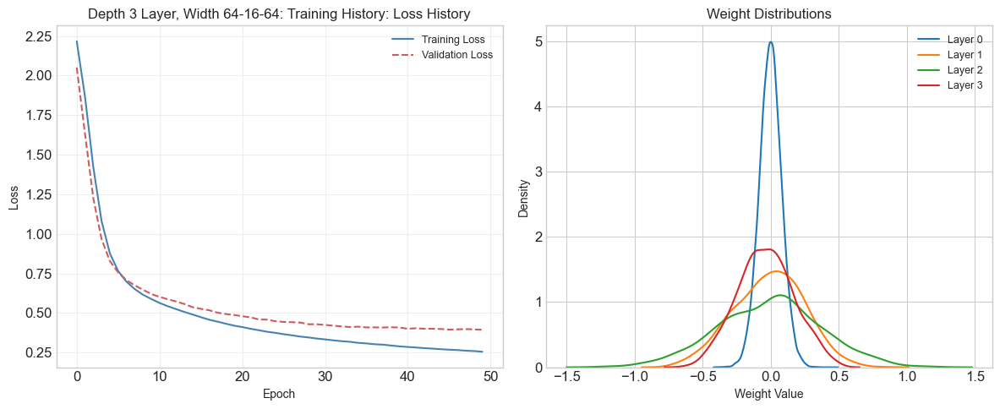

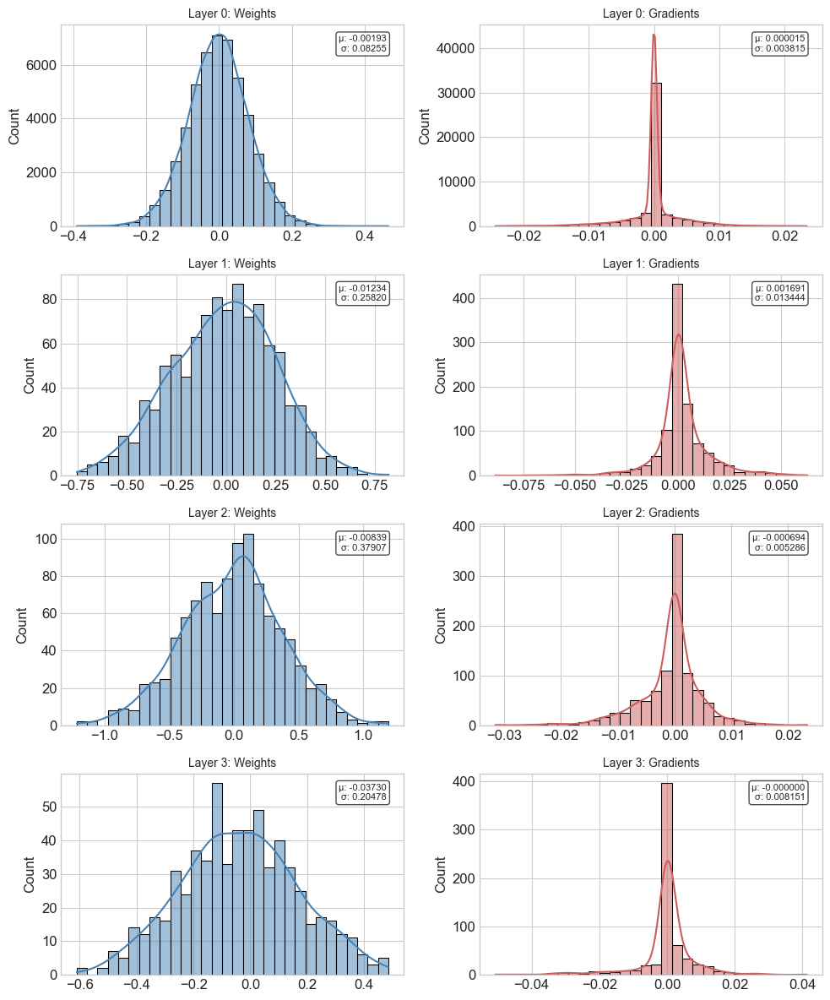

In [ ]:
trained_model_depth1_width2, history_depth1_width2, predictions_depth1_width2, accuracy_depth1_width2, results_depth1_width2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 3 Layer, Width 64-16-64",
    hidden_layers=[64, 16, 64],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 3. Depth 1: 3 Layer, Width 3: 40, 40, 40


Training Depth 3 Layer, Width 40-40-40 model...
Architecture: [40, 40, 40], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.1556 - val_loss: 2.0019oss: 2.0603
Epoch 2/50 - train_loss: 1.7803 - val_loss: 1.5602oss: 1.6578
Epoch 3/50 - train_loss: 1.3600 - val_loss: 1.1934oss: 1.2673
Epoch 4/50 - train_loss: 1.0497 - val_loss: 0.9453oss: 0.7352
Epoch 5/50 - train_loss: 0.8505 - val_loss: 0.7862oss: 0.8636
Epoch 6/50 - train_loss: 0.7240 - val_loss: 0.6867oss: 0.6918
Epoch 7/50 - train_loss: 0.6419 - val_loss: 0.6213oss: 0.8736
Epoch 8/50 - train_loss: 0.5838 - val_loss: 0.5689oss: 0.6183
Epoch 9/50 - train_loss: 0.5422 - val_loss: 0.5318oss: 0.5157
Epoch 10/50 - train_loss: 0.5089 - val_loss: 0.5026oss: 0.6983
Epoch 11/50 - train_loss: 0.4814 - val_loss: 0.4827oss: 0.2192
Epo

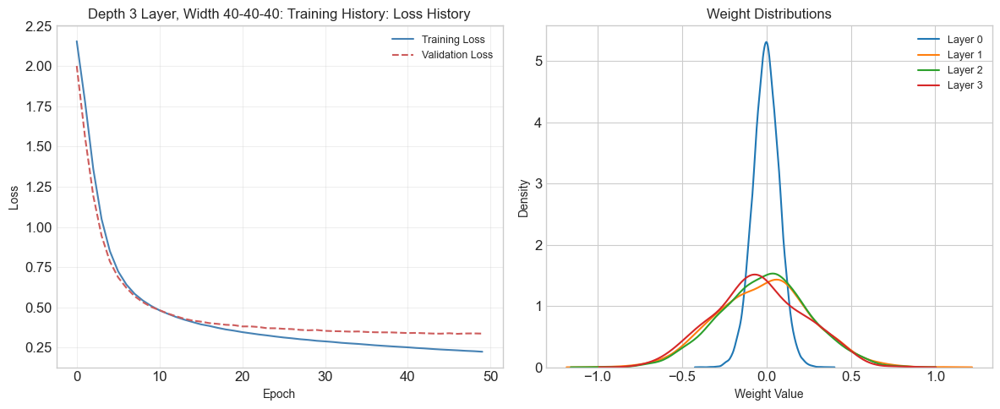

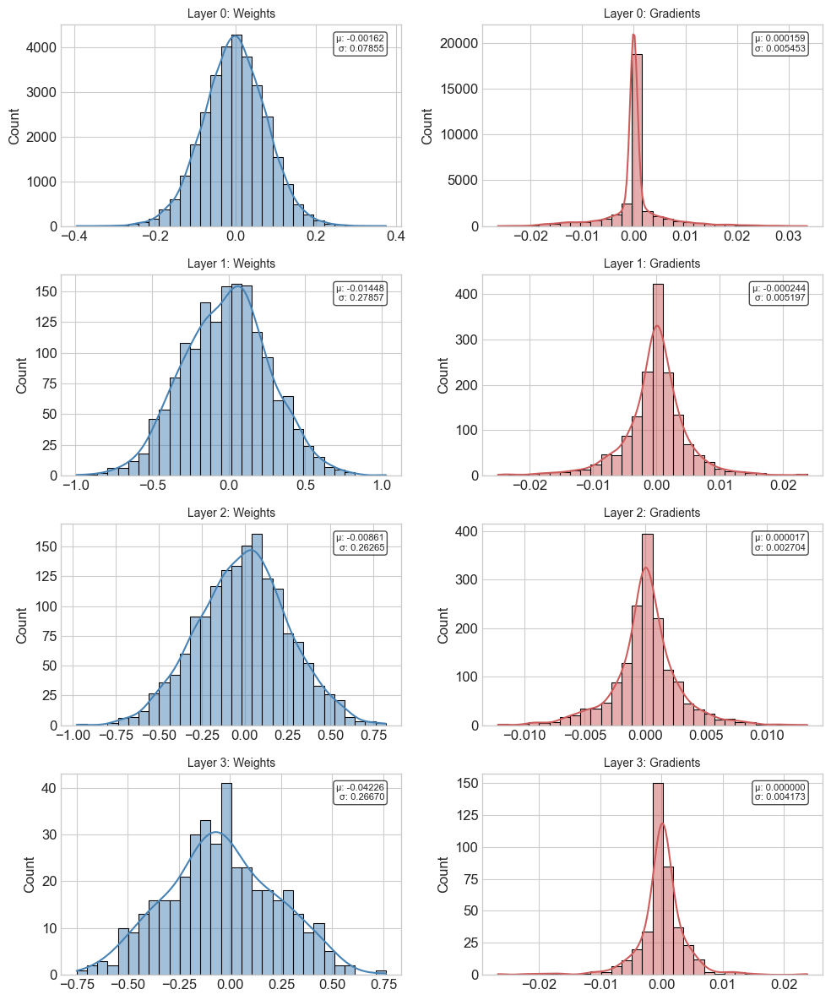

In [ ]:
trained_model_depth1_width3, history_depth1_width3, predictions_depth1_width3, accuracy_depth1_width3, results_depth1_width3 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 3 Layer, Width 40-40-40",
    hidden_layers=[40, 40, 40],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 4. Depth 2: 5 Layer, Width 1: 16, 64, 256, 64, 16


Training Depth 5 Layer, Width 16-64-256-64-16 model...
Architecture: [16, 64, 256, 64, 16], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.2426 - val_loss: 2.1349oss: 2.1588
Epoch 2/50 - train_loss: 2.0415 - val_loss: 1.8490oss: 2.0117
Epoch 3/50 - train_loss: 1.7120 - val_loss: 1.5419oss: 1.6645
Epoch 4/50 - train_loss: 1.4638 - val_loss: 1.3370oss: 1.1826
Epoch 5/50 - train_loss: 1.3074 - val_loss: 1.2351oss: 1.0911
Epoch 6/50 - train_loss: 1.2202 - val_loss: 1.1773oss: 1.6634
Epoch 7/50 - train_loss: 1.1830 - val_loss: 1.1678oss: 1.3083
Epoch 8/50 - train_loss: 1.1341 - val_loss: 1.0670oss: 1.2915
Epoch 9/50 - train_loss: 1.0514 - val_loss: 1.0292oss: 0.7435
Epoch 10/50 - train_loss: 1.0175 - val_loss: 0.9815oss: 1.2308
Epoch 11/50 - train_loss: 0.9746 - val_loss: 0.940

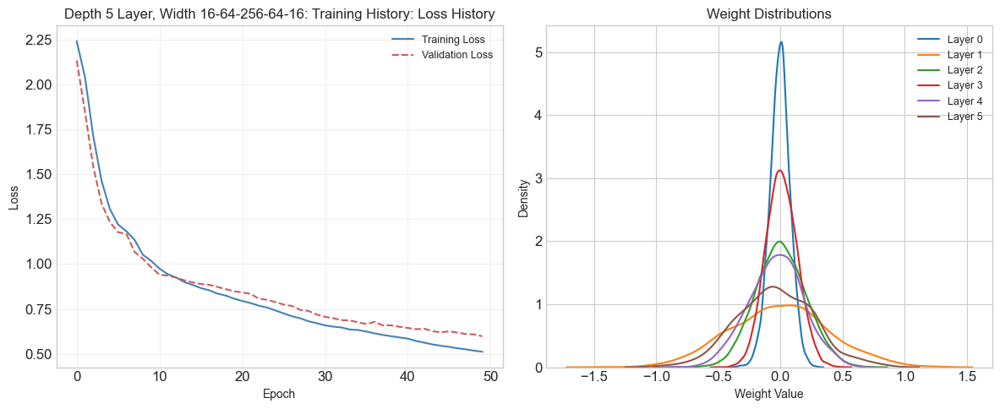

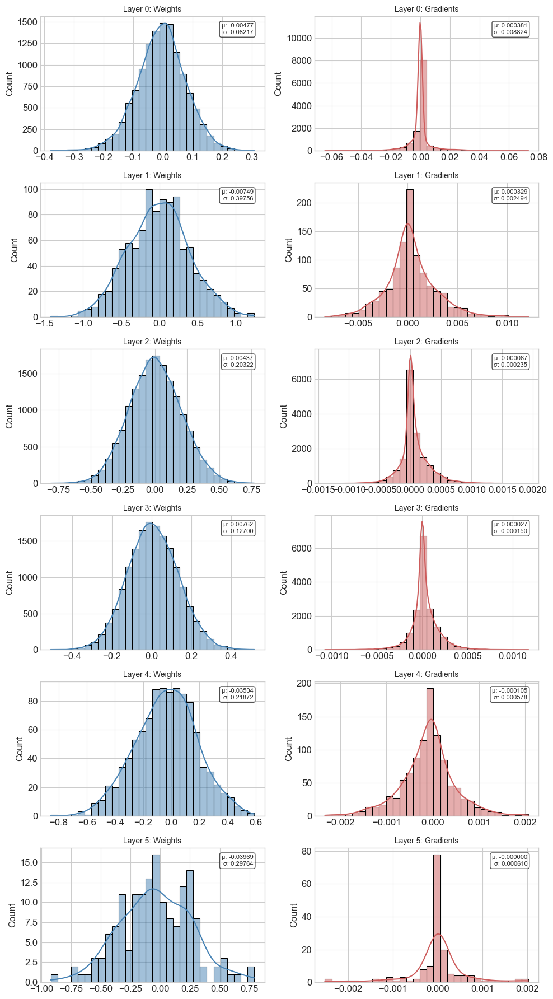

In [ ]:
trained_model_depth2_width1, history_depth2_width1, predictions_depth2_width1, accuracy_depth2_width1, results_depth2_width1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 5 Layer, Width 16-64-256-64-16",
    hidden_layers=[16, 64, 256, 64, 16],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 5. Depth 2: 5 Layer, Width 2: 256, 64, 16, 64, 256


Training Depth 5 Layer, Width 256-64-16-64-256 model...
Architecture: [256, 64, 16, 64, 256], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.9476 - val_loss: 1.4303oss: 1.4819
Epoch 2/50 - train_loss: 0.9974 - val_loss: 0.7803oss: 0.6401
Epoch 3/50 - train_loss: 0.6548 - val_loss: 0.5933oss: 0.5955
Epoch 4/50 - train_loss: 0.5287 - val_loss: 0.5025oss: 0.5588
Epoch 5/50 - train_loss: 0.4588 - val_loss: 0.4534oss: 0.3938
Epoch 6/50 - train_loss: 0.4111 - val_loss: 0.4255oss: 0.2661
Epoch 7/50 - train_loss: 0.3850 - val_loss: 0.4099oss: 0.0886
Epoch 8/50 - train_loss: 0.3594 - val_loss: 0.3926oss: 0.1122
Epoch 9/50 - train_loss: 0.3362 - val_loss: 0.3783oss: 0.2285
Epoch 10/50 - train_loss: 0.3218 - val_loss: 0.3731oss: 0.1949
Epoch 11/50 - train_loss: 0.3110 - val_loss: 0.3

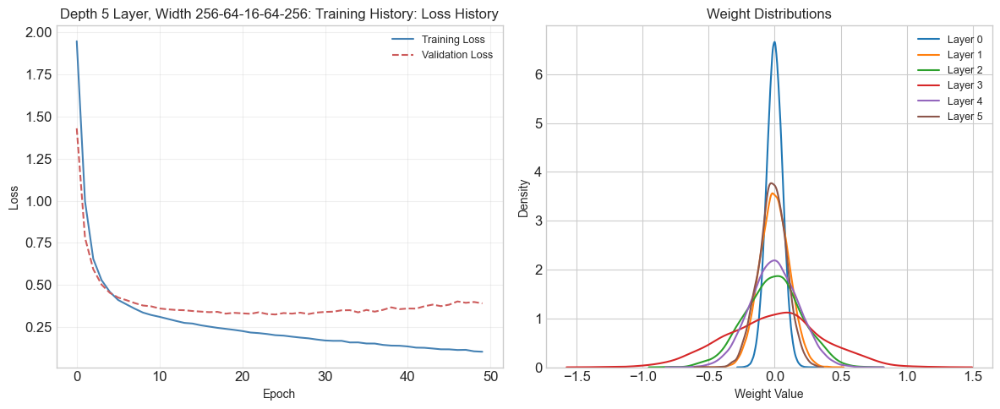

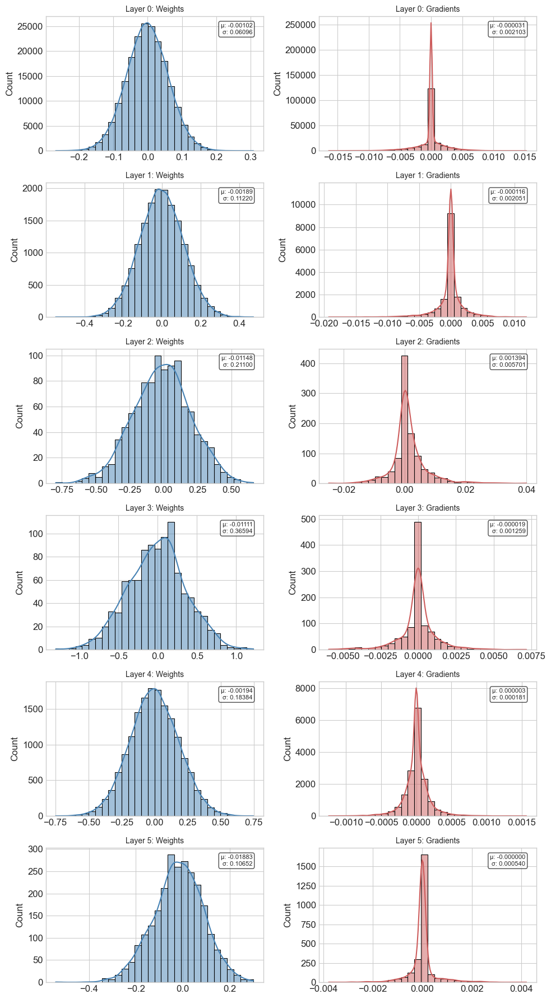

In [ ]:
trained_model_depth2_width2, history_depth2_width2, predictions_depth2_width2, accuracy_depth2_width2, results_depth2_width2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 5 Layer, Width 256-64-16-64-256",
    hidden_layers=[256, 64, 16, 64, 256],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 6. Depth 2: 5 Layer, Width 3: 108, 108, 108, 108, 108


Training Depth 5 Layer, Width 108-108-108-108-108 model...
Architecture: [108, 108, 108, 108, 108], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.0710 - val_loss: 1.7210oss: 1.7780
Epoch 2/50 - train_loss: 1.2933 - val_loss: 0.9341oss: 0.7927
Epoch 3/50 - train_loss: 0.7807 - val_loss: 0.6664oss: 0.6475
Epoch 4/50 - train_loss: 0.6005 - val_loss: 0.5490oss: 0.8599
Epoch 5/50 - train_loss: 0.5061 - val_loss: 0.4780oss: 0.2056
Epoch 6/50 - train_loss: 0.4436 - val_loss: 0.4335oss: 0.3523
Epoch 7/50 - train_loss: 0.3994 - val_loss: 0.4060oss: 0.1415
Epoch 8/50 - train_loss: 0.3671 - val_loss: 0.3907oss: 0.5561
Epoch 9/50 - train_loss: 0.3415 - val_loss: 0.3687oss: 0.3134
Epoch 10/50 - train_loss: 0.3226 - val_loss: 0.3561oss: 0.1765
Epoch 11/50 - train_loss: 0.3045 - val_los

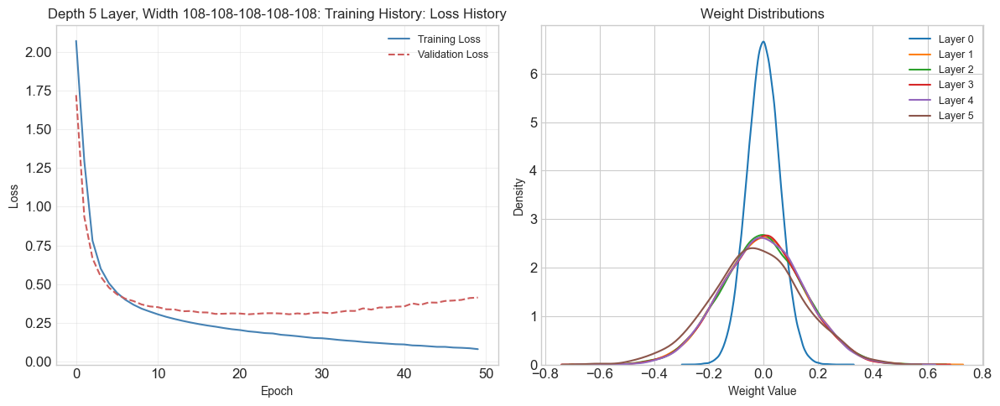

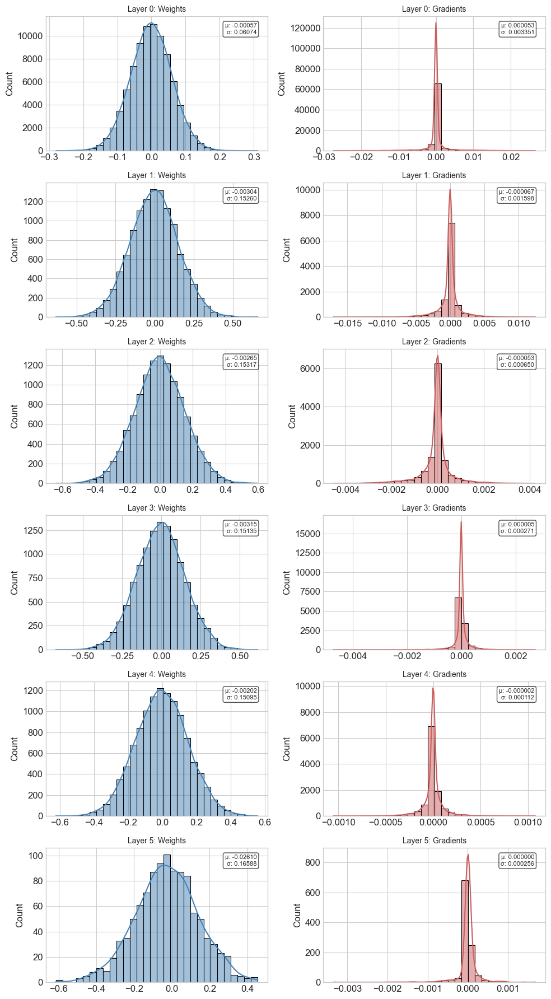

In [ ]:
trained_model_depth2_width3, history_depth2_width3, predictions_depth2_width3, accuracy_depth2_width3, results_depth2_width3 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 5 Layer, Width 108-108-108-108-108",
    hidden_layers=[108, 108, 108, 108, 108],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 7. Depth 3: 7 Layer, Width 1: 16, 64, 256, 1024, 256, 64, 16


Training Depth 7 Layer, Width 16-64-256-1024-256-64-16 model...
Architecture: [16, 64, 256, 1024, 256, 64, 16], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.1140 - val_loss: 1.8021oss: 1.8554
Epoch 2/50 - train_loss: 1.5530 - val_loss: 1.3816oss: 1.3055
Epoch 3/50 - train_loss: 1.4159 - val_loss: 1.5572oss: 1.4861
Epoch 4/50 - train_loss: 2.0513 - val_loss: 2.0555oss: 2.7018
Epoch 5/50 - train_loss: 2.5031 - val_loss: 2.8686oss: 4.6729
Epoch 6/50 - train_loss: 4.1722 - val_loss: 4.6247oss: 10.6764
Epoch 7/50 - train_loss: 5.2402 - val_loss: 5.0087oss: 5.2974
Epoch 8/50 - train_loss: 7.0106 - val_loss: 8.4243oss: 11.3142
Epoch 9/50 - train_loss: 11.4901 - val_loss: 10.8618s: 7.8954
Epoch 10/50 - train_loss: 16.3327 - val_loss: 17.1560s: 17.7306
Epoch 11/50 - train_loss: 1

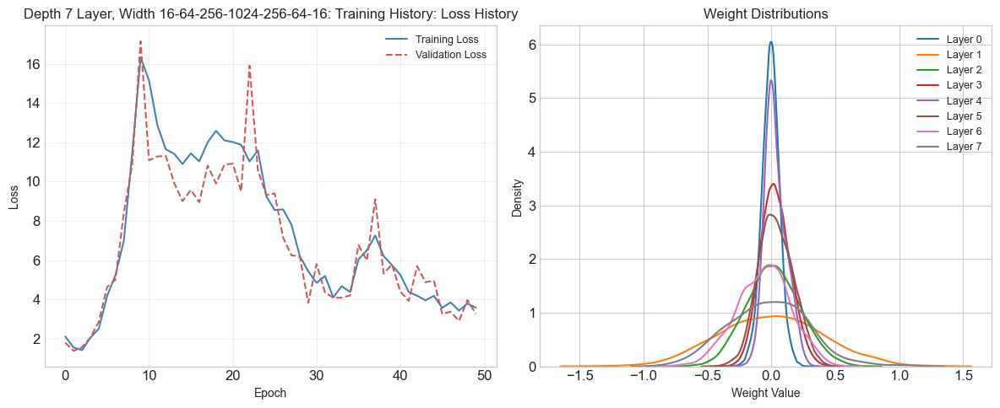

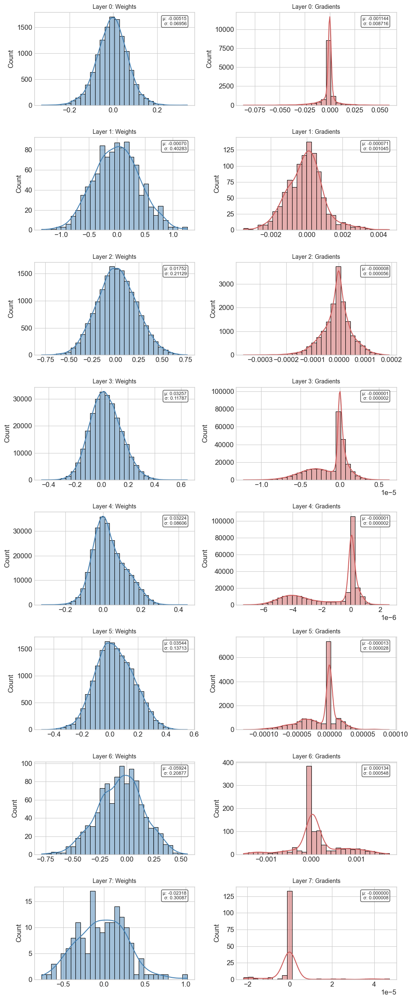

In [ ]:
trained_model_depth3_width1, history_depth3_width1, predictions_depth3_width1, accuracy_depth3_width1, results_depth3_width1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 7 Layer, Width 16-64-256-1024-256-64-16",
    hidden_layers=[16, 64, 256, 1024, 256, 64, 16],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 8. Depth 3: 7 Layer, Width 2: 1024, 256, 64, 16, 64, 256, 1024


Training Depth 7 Layer, Width 1024-256-64-16-64-256-1024 model...
Architecture: [1024, 256, 64, 16, 64, 256, 1024], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3563 - val_loss: 0.7871oss: 0.7570
Epoch 2/50 - train_loss: 0.6352 - val_loss: 0.5676oss: 0.4395
Epoch 3/50 - train_loss: 0.4751 - val_loss: 0.4692oss: 0.4021
Epoch 4/50 - train_loss: 0.3921 - val_loss: 0.4123oss: 0.1586
Epoch 5/50 - train_loss: 0.3358 - val_loss: 0.3763oss: 0.1572
Epoch 6/50 - train_loss: 0.2945 - val_loss: 0.3532oss: 0.1308
Epoch 7/50 - train_loss: 0.2678 - val_loss: 0.3213oss: 0.5880
Epoch 8/50 - train_loss: 0.2385 - val_loss: 0.3443oss: 0.5882
Epoch 9/50 - train_loss: 0.2234 - val_loss: 0.3255oss: 0.2572
Epoch 10/50 - train_loss: 0.2106 - val_loss: 0.3416oss: 0.2007
Epoch 11/50 - train_loss: 

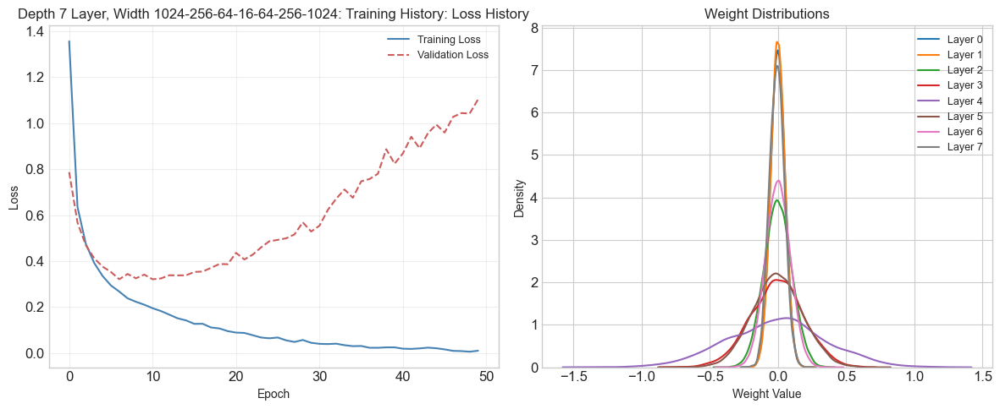

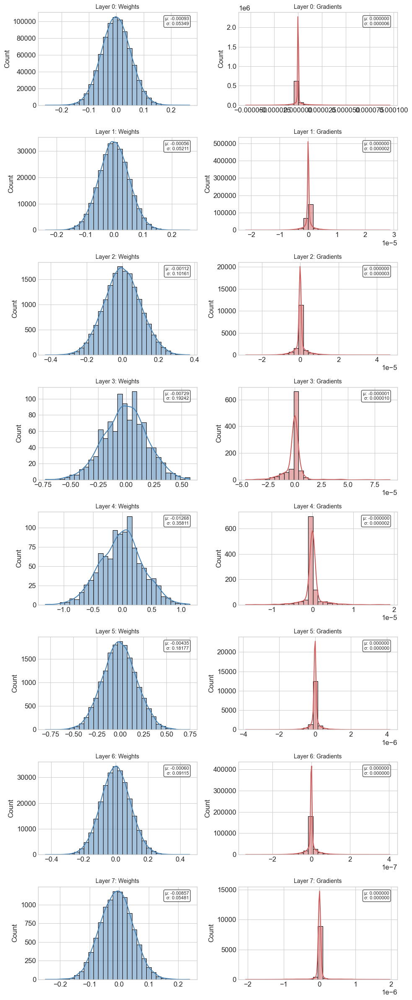

In [ ]:
trained_model_depth3_width2, history_depth3_width2, predictions_depth3_width2, accuracy_depth3_width2, results_depth3_width2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 7 Layer, Width 1024-256-64-16-64-256-1024",
    hidden_layers=[1024, 256, 64, 16, 64, 256, 1024],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 9. Depth 2: 7 Layer, Width 3: 314, 314, 314, 314, 314, 314, 314


Training Depth 7 Layer with Width 314-314-314-314-314-314-314 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3296 - val_loss: 0.6226oss: 0.5272
Epoch 2/50 - train_loss: 0.4757 - val_loss: 0.4067oss: 0.6244
Epoch 3/50 - train_loss: 0.3563 - val_loss: 0.3364oss: 0.5722
Epoch 4/50 - train_loss: 0.2947 - val_loss: 0.3119oss: 0.3568
Epoch 5/50 - train_loss: 0.2572 - val_loss: 0.2931oss: 0.3311
Epoch 6/50 - train_loss: 0.2237 - val_loss: 0.2859oss: 0.3567
Epoch 7/50 - train_loss: 0.1997 - val_loss: 0.2660oss: 0.1879
Epoch 8/50 - train_loss: 0.1793 - val_loss: 0.2772oss: 0.0850
Epoch 9/50 - train_loss: 0.1614 - val_loss: 0.2582oss: 0.0485
Epoch 10/50 - train_loss: 0.1441 - val_loss: 0.2841oss: 0.1743
Epoch 11/50 - train_

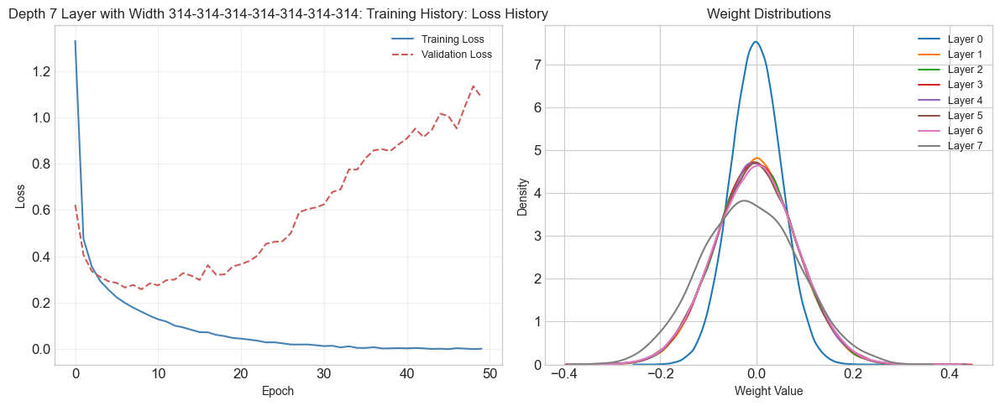

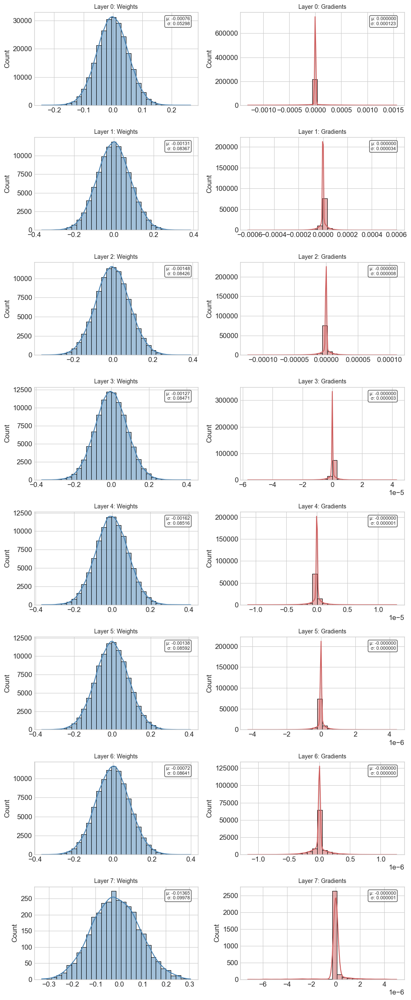

In [ ]:
trained_model_depth3_width3, history_depth3_width3, predictions_depth3_width3, accuracy_depth3_width3, results_depth3_width3 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 7 Layer with Width 314-314-314-314-314-314-314",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### Compare Hidden Layer Depth and Width

c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:174: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


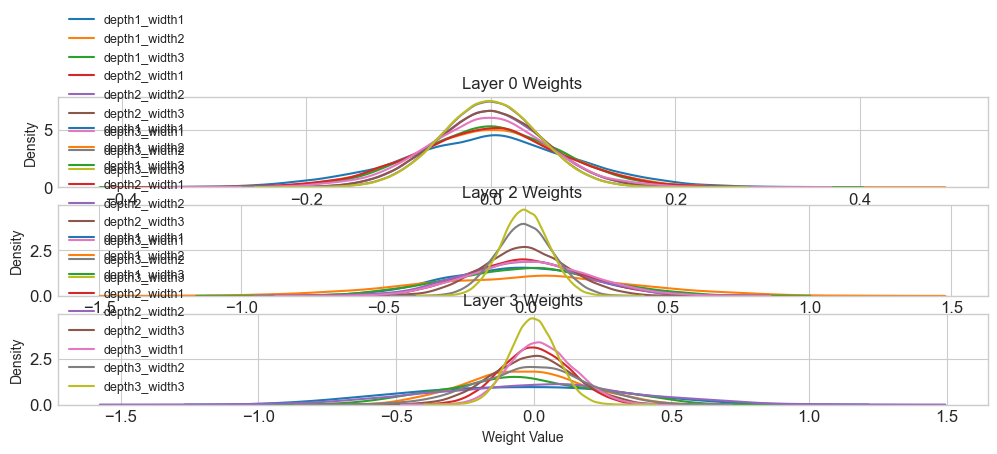

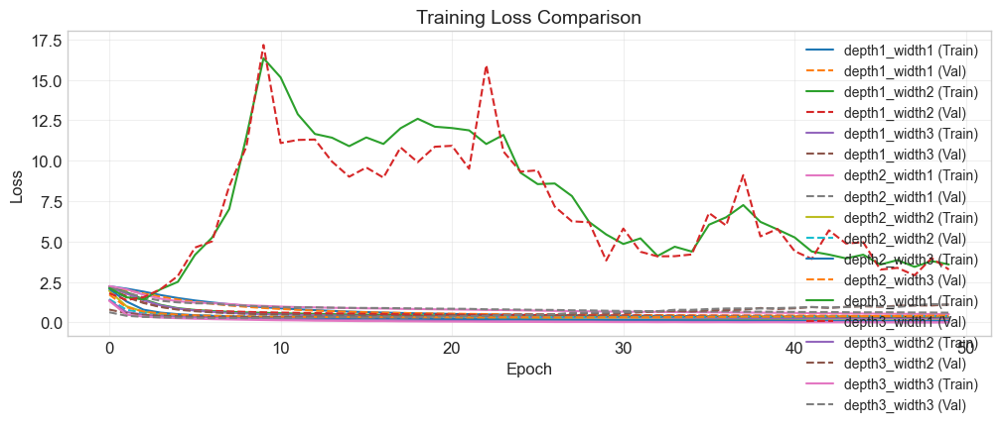

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "depth1_width1": (trained_model_depth1_width1, history_depth1_width1, predictions_depth1_width1, accuracy_depth1_width1),
    "depth1_width2": (trained_model_depth1_width2, history_depth1_width2, predictions_depth1_width2, accuracy_depth1_width2),
    "depth1_width3": (trained_model_depth1_width3, history_depth1_width3, predictions_depth1_width3, accuracy_depth1_width3),
    "depth2_width1": (trained_model_depth2_width1, history_depth2_width1, predictions_depth2_width1, accuracy_depth2_width1),
    "depth2_width2": (trained_model_depth2_width2, history_depth2_width2, predictions_depth2_width2, accuracy_depth2_width2),
    "depth2_width3": (trained_model_depth2_width3, history_depth2_width3, predictions_depth2_width3, accuracy_depth2_width3),
    "depth3_width1": (trained_model_depth3_width1, history_depth3_width1, predictions_depth3_width1, accuracy_depth3_width1),
    "depth3_width2": (trained_model_depth3_width2, history_depth3_width2, predictions_depth3_width2, accuracy_depth3_width2),
    "depth3_width3": (trained_model_depth3_width3, history_depth3_width3, predictions_depth3_width3, accuracy_depth3_width3)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## E. Hidden Layer Activation Function

- **Linear**: $f(x) = x$<br>
  **Derivative**: $\frac{d}{dx}\text{Linear}(x) = 1$  

- **ReLU**: $f(x) = \max(0, x)$ <br>
  **Derivative**: $\frac{d}{dx}\text{ReLU}(x) =   
  \begin{cases}   
  0 & \text{if } x \leq 0 \\   
  1 & \text{if } x > 0   
  \end{cases}$

- **Sigmoid**: $f(x) = \frac{1}{1 + e^{-x}}$<br>
  **Derivative**: $\frac{d}{dx} \sigma(x) = \sigma(x)(1 - \sigma(x))$

- **Tanh**: $f(x) = \frac{e^x - e^{-x}}{e^x + e^{-x}}$<br>
  **Derivative**: $\frac{d}{dx}\text{tanh}(x) = \frac{2}{(e^x - e^{-x})^2}$  

- **Softmax**: $f(x_i) = \frac{e^{x_i}}{\sum_{j=1}^n e^{x_j}}$<br>
  **Derivative**: $\frac{d(\text{softmax}(\mathbf{x}))_i}{dx_j} =   
  \begin{cases}   
  \text{softmax}(\mathbf{x})_i(1 - \text{softmax}(\mathbf{x})_i) & \text{if } i = j \\   
  -\text{softmax}(\mathbf{x})_i \cdot \text{softmax}(\mathbf{x})_j & \text{if } i \neq j
  \end{cases}$

- **Softplus**: $f(x) = \ln(1 + e^x)$<br>
  **Derivative**: $\frac{d}{dx}\text{Softplus}(x) = \frac{e^x}{1 + e^x} = \frac{1}{1 + e^{-x}} = \sigma(x)$

- **ELU** $f(x) = \begin{cases} x & \text{if } x > 0 \ \alpha(e^x - 1) & \text{if } x \leq 0 \end{cases}$ where $\alpha$ is a hyperparameter (typically 1.0) <br>
  **Derivative**: $\frac{d}{dx}\text{ELU}(x) = \begin{cases} 1 & \text{if } x > 0 \ \alpha e^x & \text{if } x \leq 0 \end{cases}$

### 1. Linear


Training Activation Function Linear model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: linear, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.0385 - val_loss: 0.6137oss: 0.4529
Epoch 2/50 - train_loss: 0.5231 - val_loss: 0.5492oss: 0.7821
Epoch 3/50 - train_loss: 0.4470 - val_loss: 0.5859oss: 0.7428
Epoch 4/50 - train_loss: 0.3931 - val_loss: 0.4869oss: 0.1745
Epoch 5/50 - train_loss: 0.3554 - val_loss: 0.5665oss: 0.9019
Epoch 6/50 - train_loss: 0.3289 - val_loss: 0.5489oss: 0.2323
Epoch 7/50 - train_loss: 0.3177 - val_loss: 0.6087oss: 0.0831
Epoch 8/50 - train_loss: 0.2958 - val_loss: 0.5093oss: 0.0270
Epoch 9/50 - train_loss: 0.2884 - val_loss: 0.6260oss: 0.3072
Epoch 10/50 - train_loss: 0.2620 - val_loss: 0.6508oss: 0.7230
Epoch 11/50 - train_loss: 0.2604 - val_loss:

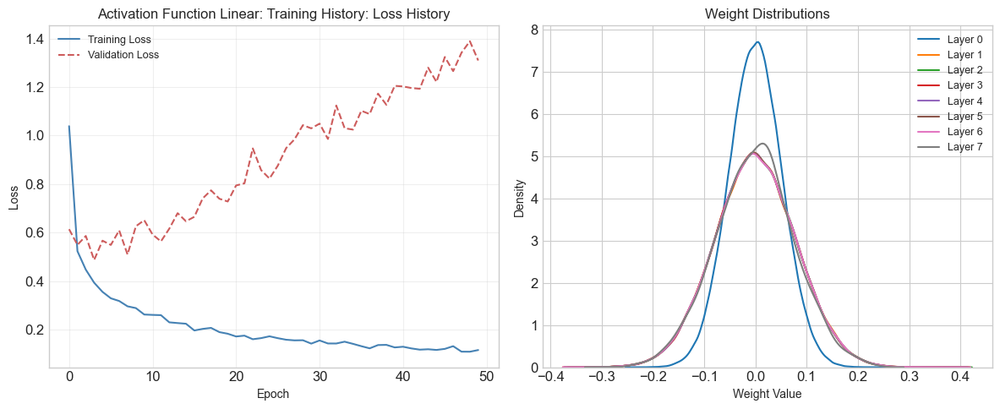

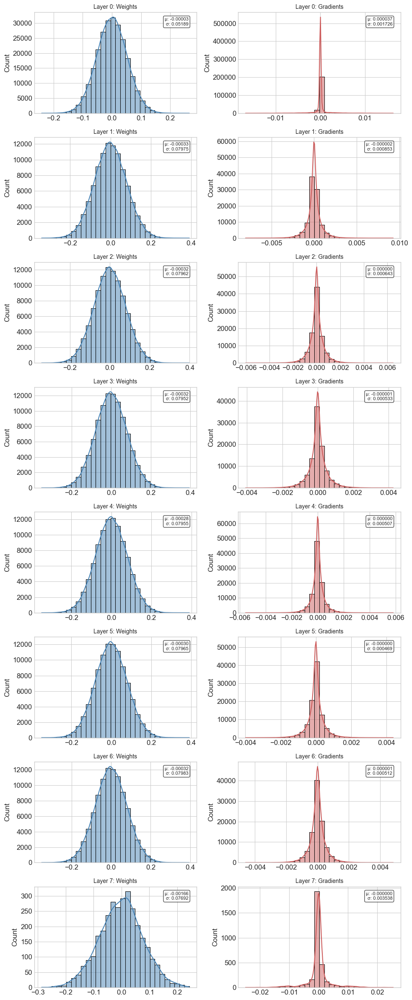

In [ ]:
trained_model_activation_linear, history_activation_linear, predictions_activation_linear, accuracy_activation_linear, results_activation_linear = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Linear",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='linear',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 2. ReLU


Training Activation Function ReLU model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3219 - val_loss: 0.6296oss: 0.6802
Epoch 2/50 - train_loss: 0.4778 - val_loss: 0.4259oss: 0.4086
Epoch 3/50 - train_loss: 0.3605 - val_loss: 0.3491oss: 0.2805
Epoch 4/50 - train_loss: 0.2953 - val_loss: 0.3292oss: 0.1476
Epoch 5/50 - train_loss: 0.2550 - val_loss: 0.3045oss: 0.2667
Epoch 6/50 - train_loss: 0.2240 - val_loss: 0.3026oss: 0.2128
Epoch 7/50 - train_loss: 0.2011 - val_loss: 0.2661oss: 0.0909
Epoch 8/50 - train_loss: 0.1806 - val_loss: 0.2612oss: 0.2448
Epoch 9/50 - train_loss: 0.1575 - val_loss: 0.2756oss: 0.1469
Epoch 10/50 - train_loss: 0.1451 - val_loss: 0.2718oss: 0.0538
Epoch 11/50 - train_loss: 0.1297 - val_loss: 0.2

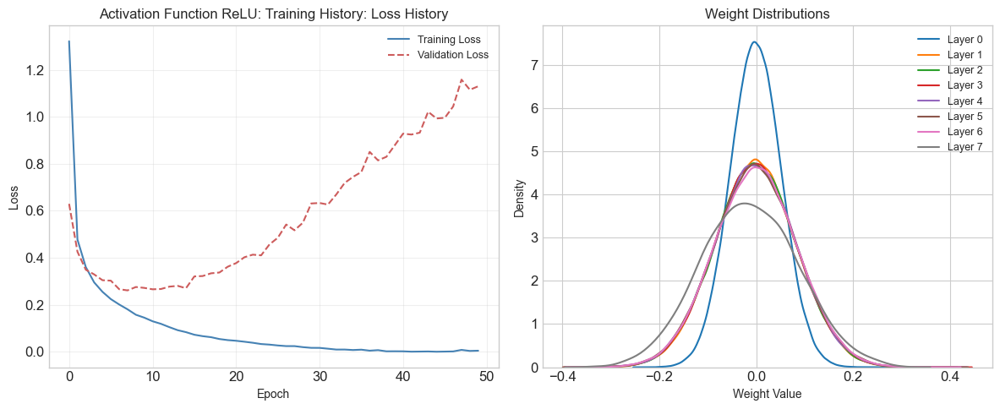

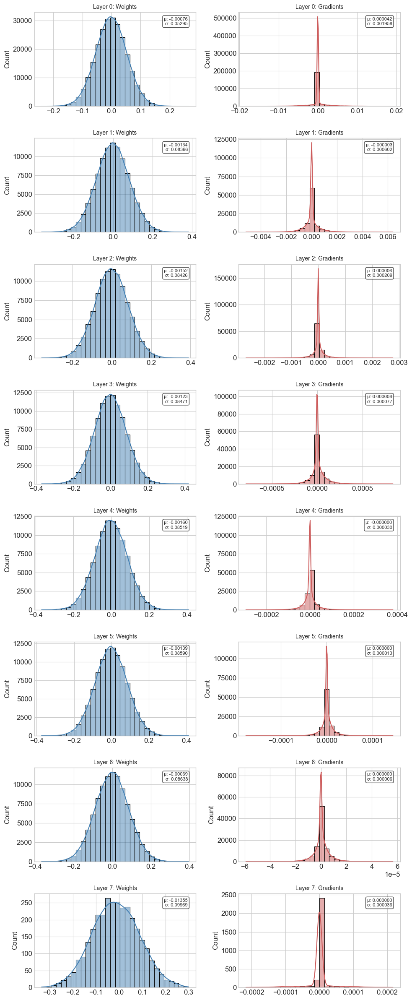

In [ ]:
trained_model_activation_relu, history_activation_relu, predictions_activation_relu, accuracy_activation_relu, results_activation_relu = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function ReLU",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 3. Sigmoid


Training Activation Function Sigmoid model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: sigmoid, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.3199 - val_loss: 2.3099oss: 2.3262
Epoch 2/50 - train_loss: 2.3010 - val_loss: 2.2968oss: 2.3065
Epoch 3/50 - train_loss: 2.2908 - val_loss: 2.2852oss: 2.2837
Epoch 4/50 - train_loss: 2.2741 - val_loss: 2.2700oss: 2.2759
Epoch 5/50 - train_loss: 2.2558 - val_loss: 2.2549oss: 2.2397
Epoch 6/50 - train_loss: 2.2408 - val_loss: 2.2415oss: 2.2184
Epoch 7/50 - train_loss: 2.2264 - val_loss: 2.2308oss: 2.1954
Epoch 8/50 - train_loss: 2.2146 - val_loss: 2.2224oss: 2.2220
Epoch 9/50 - train_loss: 2.2068 - val_loss: 2.2160oss: 2.2126
Epoch 10/50 - train_loss: 2.1997 - val_loss: 2.2109oss: 2.1696
Epoch 11/50 - train_loss: 2.1937 - val_los

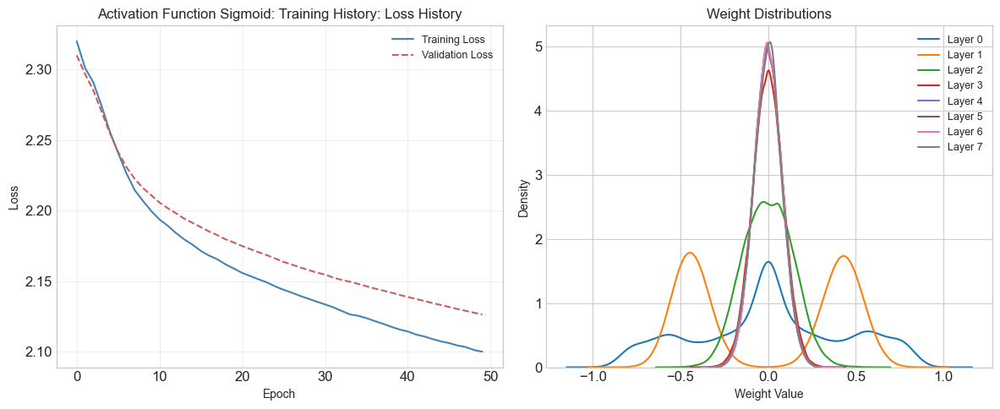

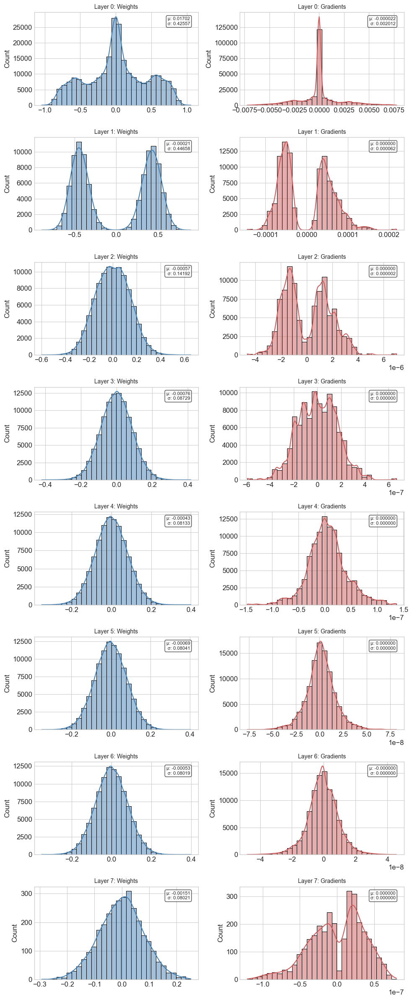

In [ ]:
trained_model_activation_sigmoid, history_activation_sigmoid, predictions_activation_sigmoid, accuracy_activation_sigmoid, results_activation_sigmoid = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Sigmoid",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='sigmoid',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 4 TanH


Training Activation Function TanH model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: tanh, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.7144 - val_loss: 0.4444oss: 0.2619
Epoch 2/50 - train_loss: 0.3881 - val_loss: 0.4002oss: 0.4374
Epoch 3/50 - train_loss: 0.3273 - val_loss: 0.3580oss: 0.2932
Epoch 4/50 - train_loss: 0.2899 - val_loss: 0.3547oss: 0.3021
Epoch 5/50 - train_loss: 0.2612 - val_loss: 0.3436oss: 0.0806
Epoch 6/50 - train_loss: 0.2371 - val_loss: 0.3253oss: 0.1932
Epoch 7/50 - train_loss: 0.2221 - val_loss: 0.3337oss: 0.1093
Epoch 8/50 - train_loss: 0.2003 - val_loss: 0.3391oss: 0.1763
Epoch 9/50 - train_loss: 0.1917 - val_loss: 0.3529oss: 0.0793
Epoch 10/50 - train_loss: 0.1799 - val_loss: 0.3406oss: 0.3132
Epoch 11/50 - train_loss: 0.1698 - val_loss: 0.3

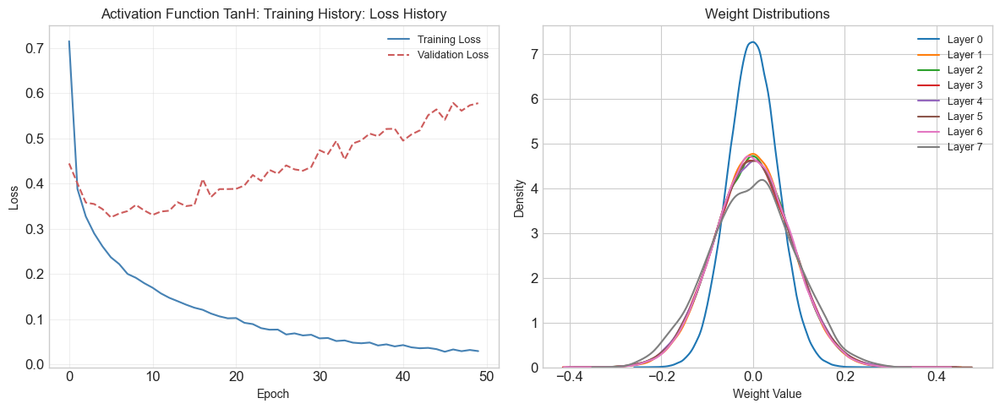

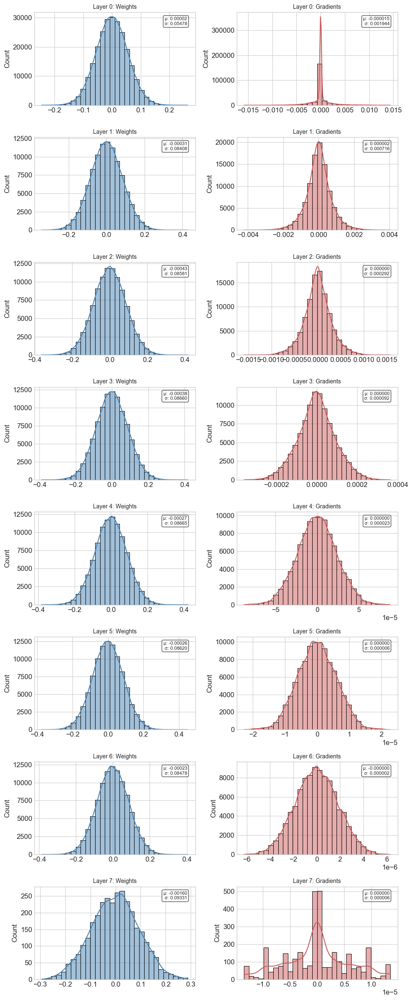

In [ ]:
trained_model_activation_tanh, history_activation_tanh, predictions_activation_tanh, accuracy_activation_tanh, results_activation_tanh = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function TanH",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='tanh',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 5. Softmax


Training Activation Function Softmax model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: softmax, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.3024 - val_loss: 2.3024oss: 2.3036
Epoch 2/50 - train_loss: 2.3021 - val_loss: 2.3024oss: 2.2995
Epoch 3/50 - train_loss: 2.3019 - val_loss: 2.3023oss: 2.3004
Epoch 4/50 - train_loss: 2.3019 - val_loss: 2.3023oss: 2.3033
Epoch 5/50 - train_loss: 2.3018 - val_loss: 2.3023oss: 2.3020
Epoch 6/50 - train_loss: 2.3018 - val_loss: 2.3023oss: 2.2988
Epoch 7/50 - train_loss: 2.3018 - val_loss: 2.3023oss: 2.3011
Epoch 8/50 - train_loss: 2.3018 - val_loss: 2.3023oss: 2.3037
Epoch 9/50 - train_loss: 2.3018 - val_loss: 2.3023oss: 2.2970
Epoch 10/50 - train_loss: 2.3017 - val_loss: 2.3023oss: 2.3047
Epoch 11/50 - train_loss: 2.3017 - val_los

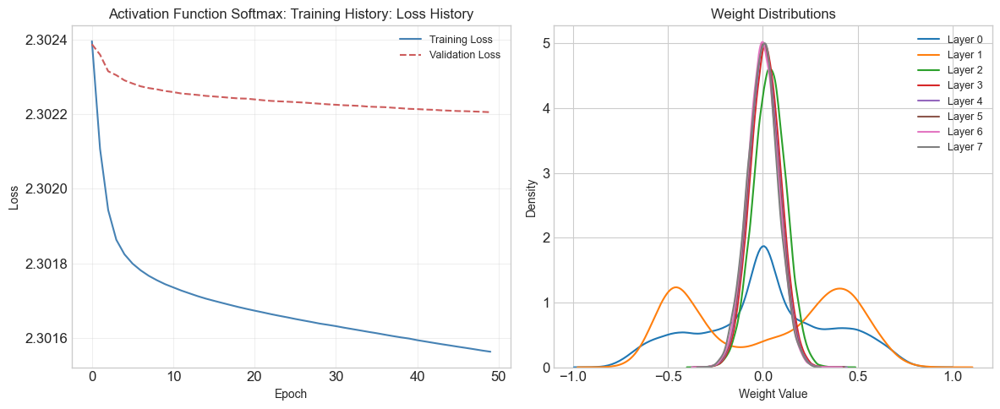

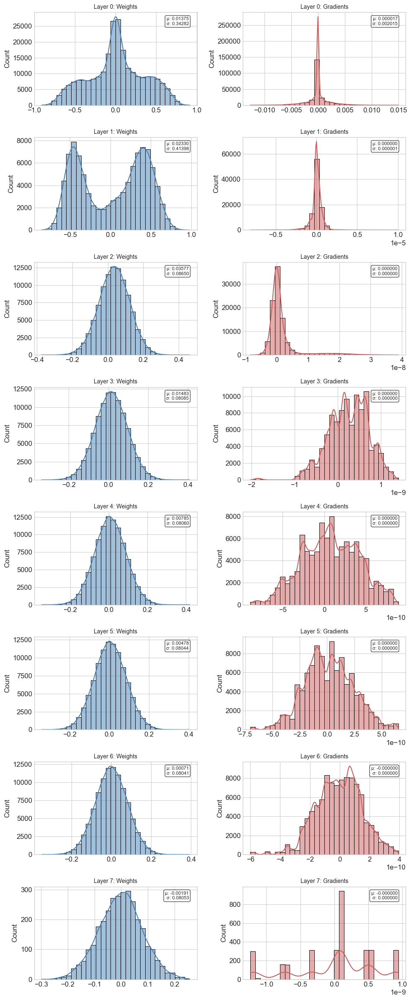

In [ ]:
trained_model_activation_softmax, history_activation_softmax, predictions_activation_softmax, accuracy_activation_softmax, results_activation_softmax = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Softmax",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='softmax',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 6. Softplus


Training Activation Function Softplus model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: softplus, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.0697 - val_loss: 1.4514oss: 1.3820
Epoch 2/50 - train_loss: 0.9616 - val_loss: 0.7348oss: 0.7613
Epoch 3/50 - train_loss: 0.6014 - val_loss: 0.5559oss: 0.5076
Epoch 4/50 - train_loss: 0.4864 - val_loss: 0.4511oss: 0.4679
Epoch 5/50 - train_loss: 0.4243 - val_loss: 0.4062oss: 0.5618
Epoch 6/50 - train_loss: 0.3832 - val_loss: 0.4095oss: 0.5413
Epoch 7/50 - train_loss: 0.3596 - val_loss: 0.3832oss: 0.6361
Epoch 8/50 - train_loss: 0.3352 - val_loss: 0.3520oss: 0.2169
Epoch 9/50 - train_loss: 0.3205 - val_loss: 0.3614oss: 0.5175
Epoch 10/50 - train_loss: 0.2986 - val_loss: 0.3634oss: 0.2566
Epoch 11/50 - train_loss: 0.2911 - val_l

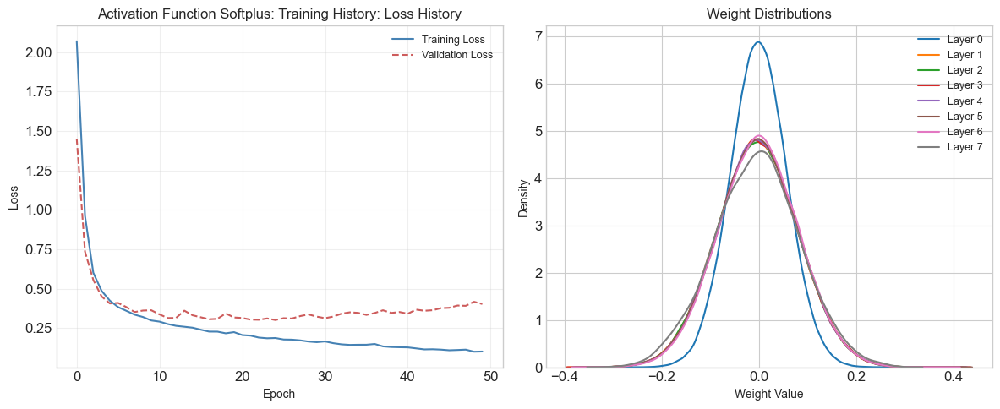

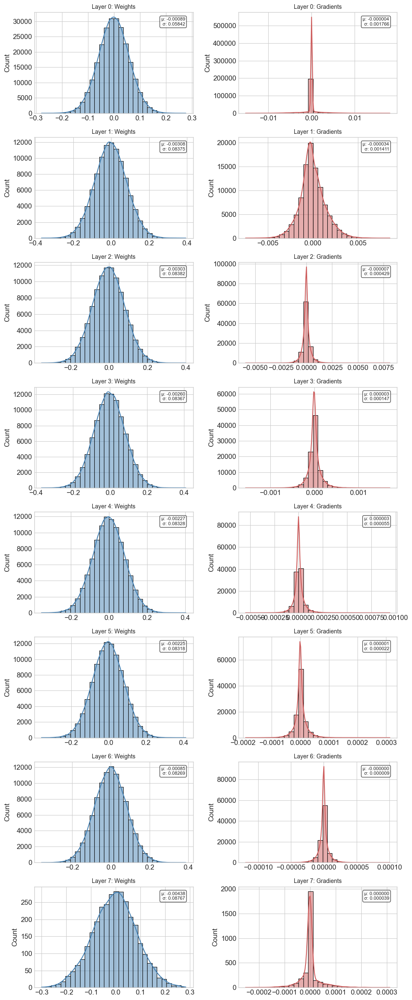

In [ ]:
trained_model_activation_softplus, history_activation_softplus, predictions_activation_softplus, accuracy_activation_softplus, results_activation_softplus = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Softplus",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='softplus',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 7. ELU


Training Activation Function ELU model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: elu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.7023 - val_loss: 0.4402oss: 0.5709
Epoch 2/50 - train_loss: 0.3620 - val_loss: 0.3692oss: 0.3016
Epoch 3/50 - train_loss: 0.2969 - val_loss: 0.3541oss: 0.2773
Epoch 4/50 - train_loss: 0.2571 - val_loss: 0.3508oss: 0.2366
Epoch 5/50 - train_loss: 0.2233 - val_loss: 0.3824oss: 0.0956
Epoch 6/50 - train_loss: 0.2058 - val_loss: 0.3677oss: 0.1954
Epoch 7/50 - train_loss: 0.1829 - val_loss: 0.3510oss: 0.1766
Epoch 8/50 - train_loss: 0.1603 - val_loss: 0.3965oss: 0.3562
Epoch 9/50 - train_loss: 0.1565 - val_loss: 0.3735oss: 0.1624
Epoch 10/50 - train_loss: 0.1346 - val_loss: 0.4110oss: 0.1445
Epoch 11/50 - train_loss: 0.1292 - val_loss: 0.417

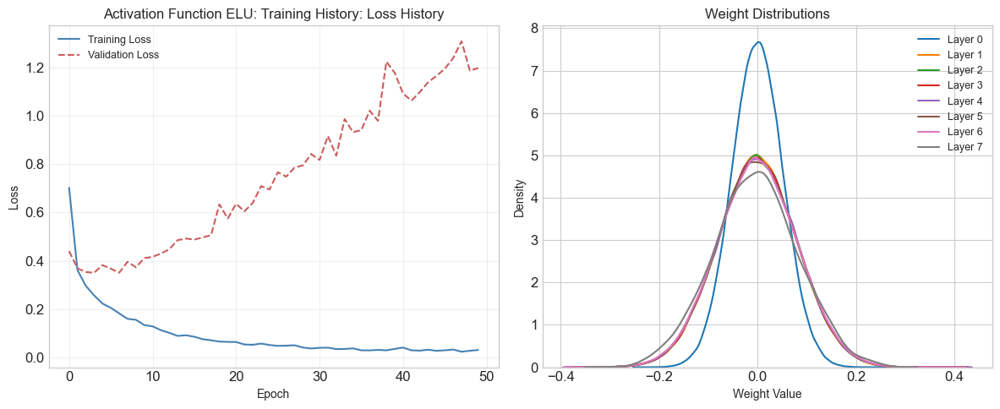

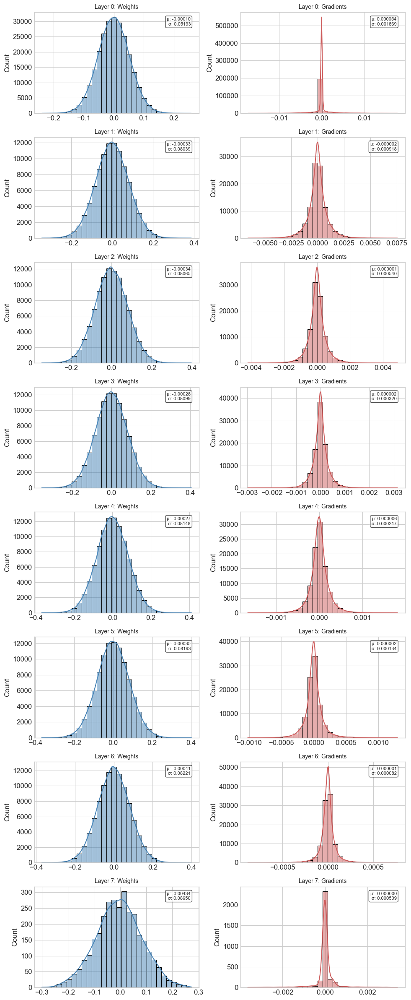

In [ ]:
trained_model_activation_elu, history_activation_elu, predictions_activation_elu, accuracy_activation_elu, results_activation_elu = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function ELU",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='elu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Compare Hidden Layer Activation Function

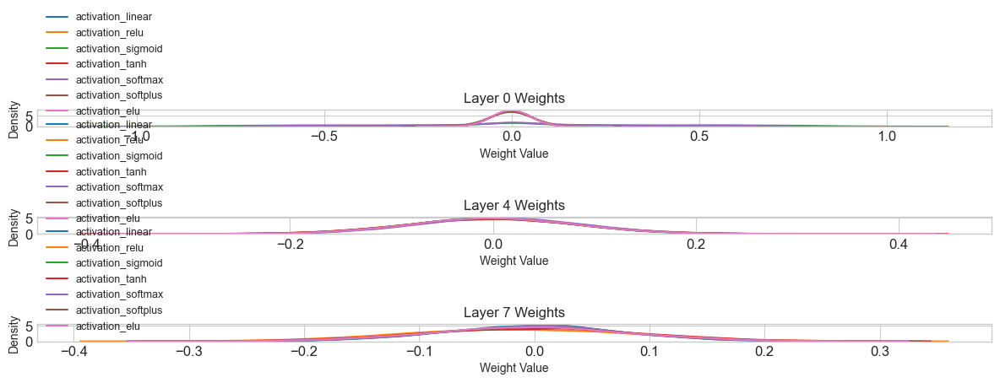

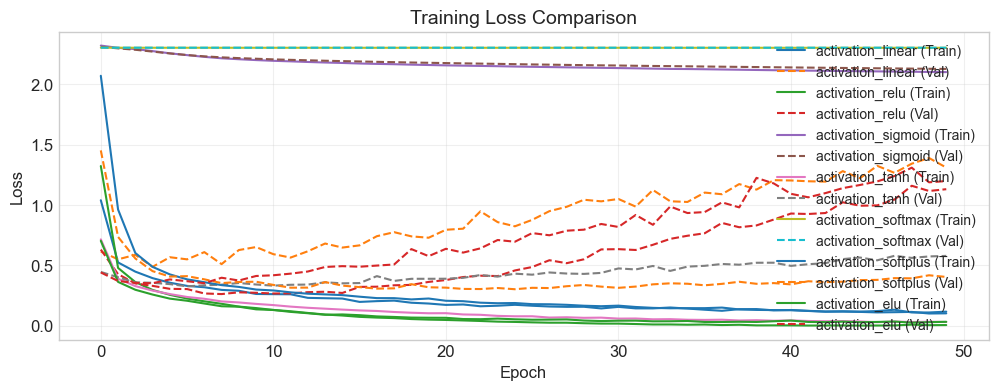

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "activation_linear": (trained_model_activation_linear, history_activation_linear, predictions_activation_linear, accuracy_activation_linear),
    "activation_relu": (trained_model_activation_relu, history_activation_relu, predictions_activation_relu, accuracy_activation_relu),
    "activation_sigmoid": (trained_model_activation_sigmoid, history_activation_sigmoid, predictions_activation_sigmoid, accuracy_activation_sigmoid),
    "activation_tanh": (trained_model_activation_tanh, history_activation_tanh, predictions_activation_tanh, accuracy_activation_tanh),
    "activation_softmax": (trained_model_activation_softmax, history_activation_softmax, predictions_activation_softmax, accuracy_activation_softmax),
    "activation_softplus": (trained_model_activation_softplus, history_activation_softplus, predictions_activation_softplus, accuracy_activation_softplus),
    "activation_elu": (trained_model_activation_elu, history_activation_elu, predictions_activation_elu, accuracy_activation_elu)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## F. Output Layer Activation Function

- **Sigmoid**: $f(x) = \frac{1}{1 + e^{-x}}$<br>
  **Derivative**: $\frac{d}{dx} \sigma(x) = \sigma(x)(1 - \sigma(x))$

- **Softmax**: $f(x_i) = \frac{e^{x_i}}{\sum_{j=1}^n e^{x_j}}$<br>
  **Derivative**: $\frac{d(\text{softmax}(\mathbf{x}))_i}{dx_j} =   
  \begin{cases}   
  \text{softmax}(\mathbf{x})_i(1 - \text{softmax}(\mathbf{x})_i) & \text{if } i = j \\   
  -\text{softmax}(\mathbf{x})_i \cdot \text{softmax}(\mathbf{x})_j & \text{if } i \neq j
  \end{cases}$

### 1. Sigmoid


Training Output Layer Activation Function Sigmoid model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.4686 - val_loss: 0.7962oss: 0.7100
Epoch 2/50 - train_loss: 0.6141 - val_loss: 0.5029oss: 0.4108
Epoch 3/50 - train_loss: 0.4381 - val_loss: 0.3978oss: 0.3742
Epoch 4/50 - train_loss: 0.3562 - val_loss: 0.3504oss: 0.1761
Epoch 5/50 - train_loss: 0.3115 - val_loss: 0.3381oss: 0.4571
Epoch 6/50 - train_loss: 0.2727 - val_loss: 0.3365oss: 0.3349
Epoch 7/50 - train_loss: 0.2494 - val_loss: 0.2989oss: 0.3549
Epoch 8/50 - train_loss: 0.2253 - val_loss: 0.3016oss: 0.0637
Epoch 9/50 - train_loss: 0.2052 - val_loss: 0.2832oss: 0.3068
Epoch 10/50 - train_loss: 0.1874 - val_loss: 0.2958oss: 0.2662
Epoch 11/50 - train_loss: 0.1731

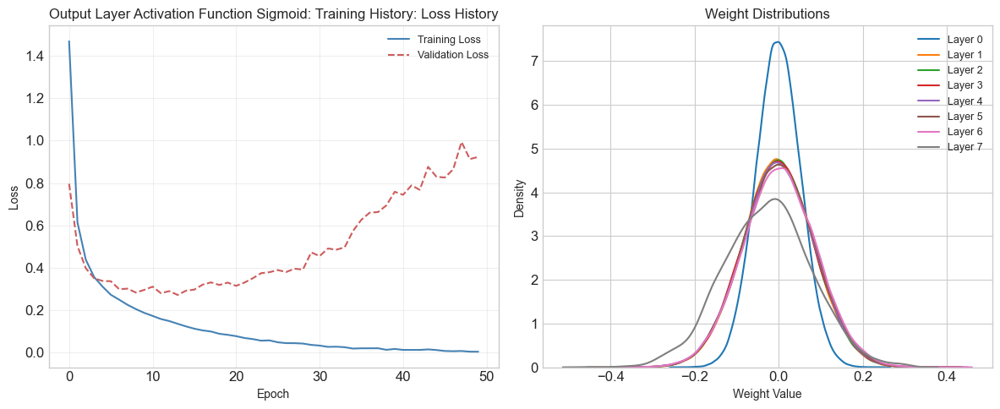

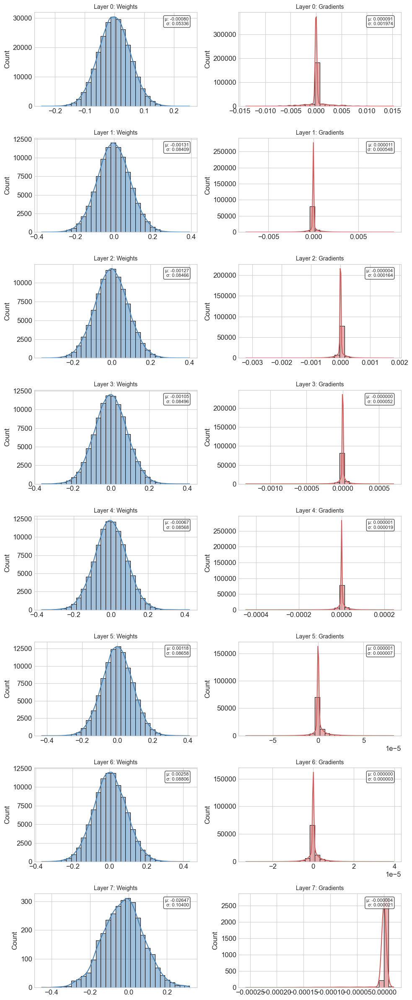

In [ ]:
trained_model_output_activate_sigmoid, history_output_activate_sigmoid, predictions_output_activate_sigmoid, accuracy_output_activate_sigmoid, results_output_activate_sigmoid = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Output Layer Activation Function Sigmoid",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='sigmoid',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 2. Softmax


Training Output Layer Activation Function Softmax model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3296 - val_loss: 0.6134oss: 0.5519
Epoch 2/50 - train_loss: 0.4775 - val_loss: 0.4136oss: 0.3058
Epoch 3/50 - train_loss: 0.3573 - val_loss: 0.3747oss: 0.5499
Epoch 4/50 - train_loss: 0.2955 - val_loss: 0.3133oss: 0.3536
Epoch 5/50 - train_loss: 0.2539 - val_loss: 0.2836oss: 0.2857
Epoch 6/50 - train_loss: 0.2246 - val_loss: 0.2827oss: 0.1378
Epoch 7/50 - train_loss: 0.2000 - val_loss: 0.2875oss: 0.5170
Epoch 8/50 - train_loss: 0.1827 - val_loss: 0.2591oss: 0.0556
Epoch 9/50 - train_loss: 0.1590 - val_loss: 0.2532oss: 0.1942
Epoch 10/50 - train_loss: 0.1438 - val_loss: 0.2576oss: 0.2324
Epoch 11/50 - train_loss: 0.1311

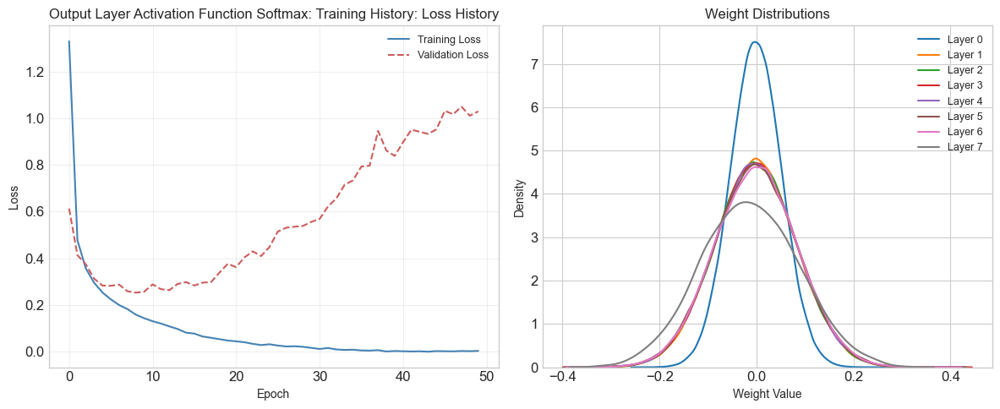

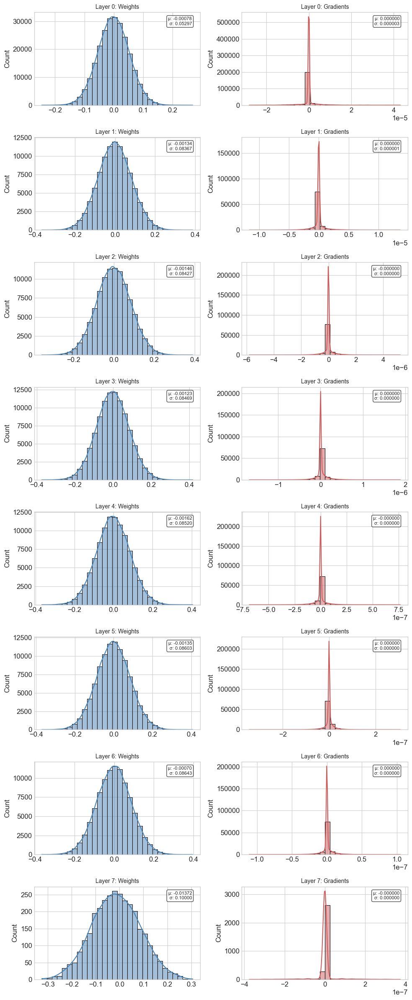

In [ ]:
trained_model_output_activate_softmax, history_output_activate_softmax, predictions_output_activate_softmax, accuracy_output_activate_softmax, results_output_activate_softmax = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Output Layer Activation Function Softmax",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### Compare Output Layer Activation Function

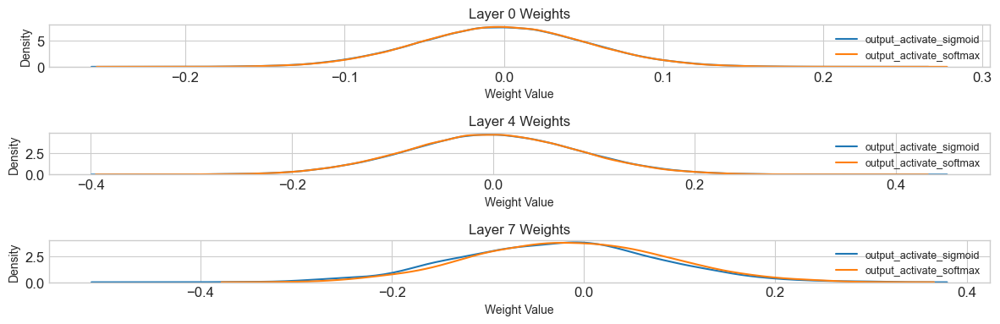

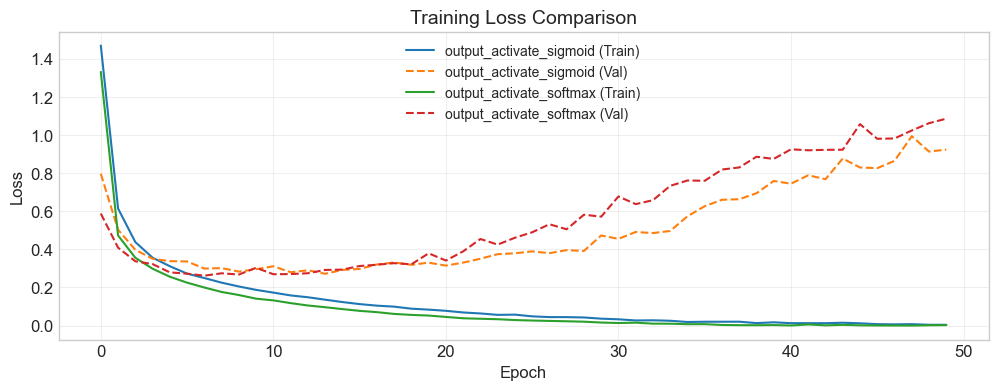

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "output_activate_sigmoid": (trained_model_output_activate_sigmoid, history_output_activate_sigmoid, predictions_output_activate_sigmoid, accuracy_output_activate_sigmoid),
    "output_activate_softmax": (trained_model_output_activate_softmax, history_output_activate_softmax, predictions_output_activate_softmax, accuracy_output_activate_softmax)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## G. Learning Rate

- **0.01**
- **0.001**
- **0.0001**

### 1. 0.01


Training Learning Rate 0.01 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.01, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.01, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.01, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 9.5453 - val_loss: 13.8615ss: 13.1665
Epoch 2/50 - train_loss: 5.6270 - val_loss: 5.6303oss: 6.3496
Epoch 3/50 - train_loss: 5.4452 - val_loss: 2.7686oss: 2.8204
Epoch 4/50 - train_loss: 7.4812 - val_loss: 27.6064ss: 26.9834
Epoch 5/50 - train_loss: 25.5817 - val_loss: 21.8847s: 20.9028
Epoch 6/50 - train_loss: 21.6310 - val_loss: 21.9783s: 24.0842
Epoch 7/50 - train_loss: 22.6588 - val_loss: 21.0740s: 22.4781
Epoch 8/50 - train_loss: 17.3958 - val_loss: 16.2421s: 14.6206
Epoch 9/50 - train_loss: 16.7326 - val_loss: 16.9182s: 15.4610
Epoch 10/50 - train_loss: 18.9778 - val_loss: 19.0568s: 19.5426
Epoch 11/50 - train_loss: 18.1323 - val_loss: 19.182

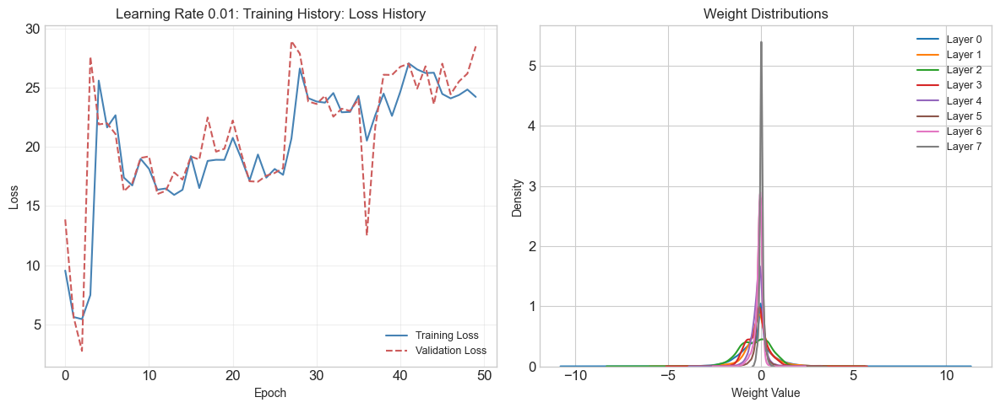

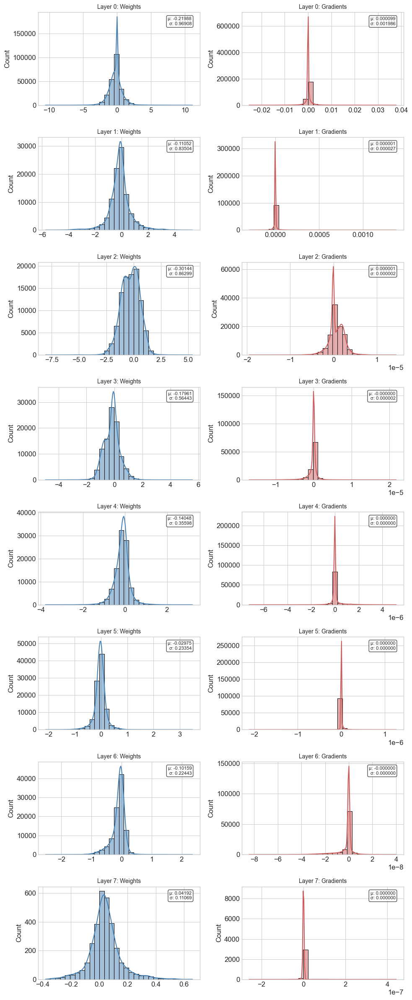

In [ ]:
trained_model_lr_001, history_lr_001, predictions_lr_001, accuracy_lr_001, results_lr_001 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Learning Rate 0.01",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.01,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 2. 0.001


Training Learning Rate 0.001 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.7442 - val_loss: 0.4964oss: 0.8779
Epoch 2/50 - train_loss: 0.3828 - val_loss: 0.4160oss: 0.6560
Epoch 3/50 - train_loss: 0.3049 - val_loss: 0.3824oss: 0.2996
Epoch 4/50 - train_loss: 0.2685 - val_loss: 0.2973oss: 0.3408
Epoch 5/50 - train_loss: 0.2385 - val_loss: 0.3007oss: 0.4873
Epoch 6/50 - train_loss: 0.2165 - val_loss: 0.4084oss: 0.0366
Epoch 7/50 - train_loss: 0.2130 - val_loss: 0.3811oss: 0.1105
Epoch 8/50 - train_loss: 0.2107 - val_loss: 0.3595oss: 0.2149
Epoch 9/50 - train_loss: 0.1850 - val_loss: 0.4385oss: 0.0458
Epoch 10/50 - train_loss: 0.1866 - val_loss: 0.3630oss: 0.5423
Epoch 11/50 - train_loss: 0.1811 - val_loss: 0.5192oss: 

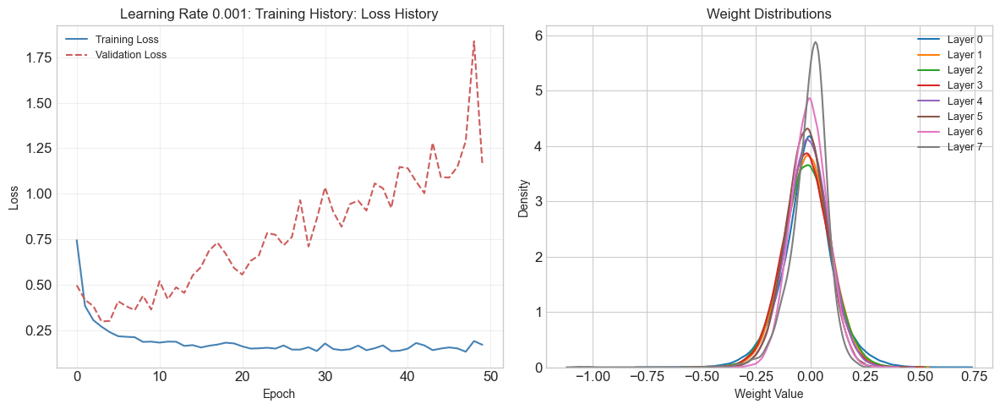

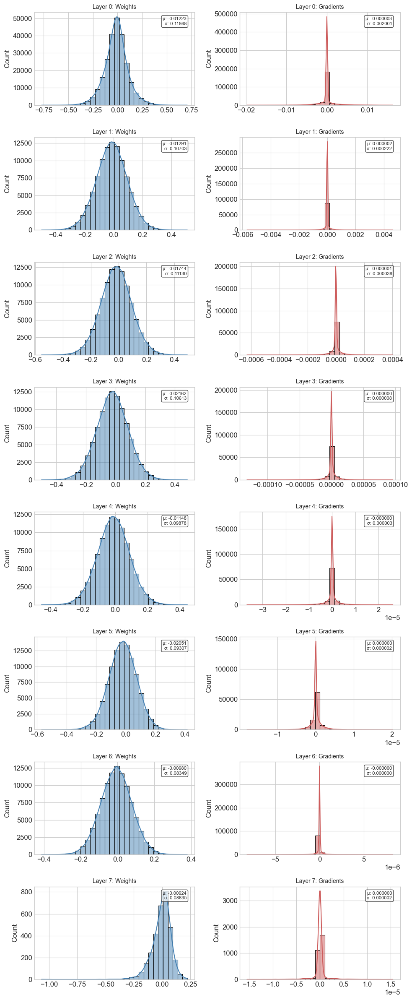

In [ ]:
trained_model_lr_0001, history_lr_0001, predictions_lr_0001, accuracy_lr_0001, results_lr_0001 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Learning Rate 0.001",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 3. 0.0001


Training Learning Rate 0.0001 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3144 - val_loss: 0.6349oss: 0.5862
Epoch 2/50 - train_loss: 0.4796 - val_loss: 0.4200oss: 0.4671
Epoch 3/50 - train_loss: 0.3558 - val_loss: 0.3376oss: 0.1631
Epoch 4/50 - train_loss: 0.2949 - val_loss: 0.3031oss: 0.2481
Epoch 5/50 - train_loss: 0.2526 - val_loss: 0.2887oss: 0.3795
Epoch 6/50 - train_loss: 0.2225 - val_loss: 0.2834oss: 0.2851
Epoch 7/50 - train_loss: 0.2004 - val_loss: 0.2961oss: 0.2091
Epoch 8/50 - train_loss: 0.1788 - val_loss: 0.2813oss: 0.5547
Epoch 9/50 - train_loss: 0.1658 - val_loss: 0.2609oss: 0.1415
Epoch 10/50 - train_loss: 0.1421 - val_loss: 0.2647oss: 0.0802
Epoch 11/50 - train_loss: 0.1298 - val_loss: 0.2957o

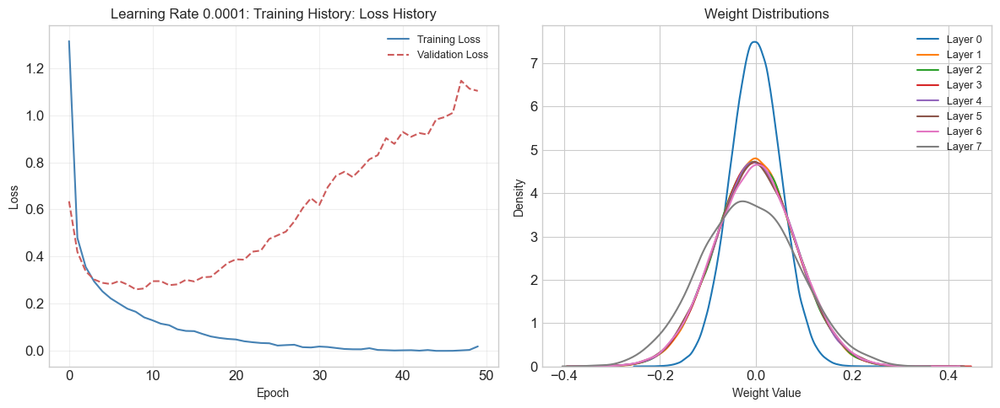

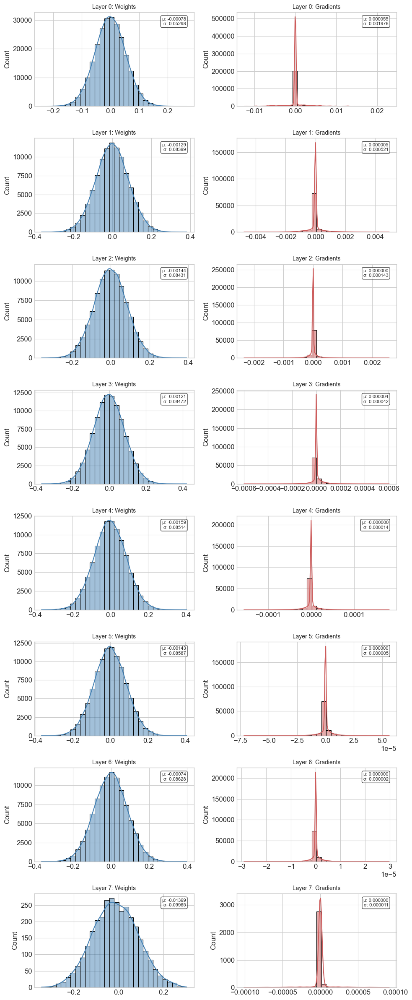

In [ ]:
trained_model_lr_00001, history_lr_00001, predictions_lr_00001, accuracy_lr_00001, results_lr_00001 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Learning Rate 0.0001",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### Compare Learning Rate

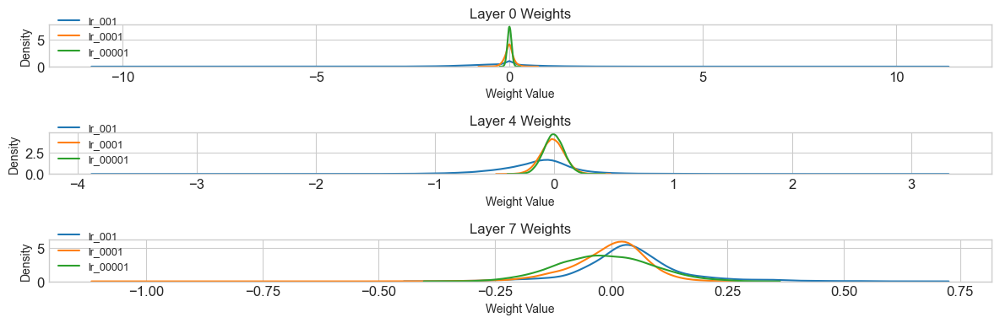

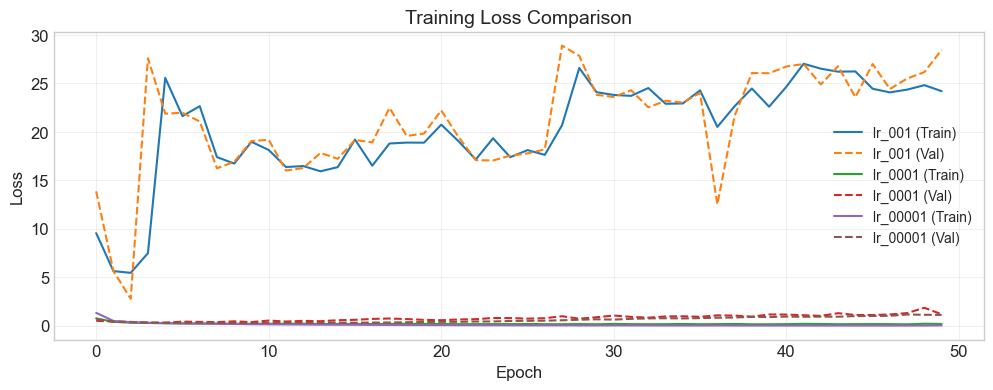

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "lr_001": (trained_model_lr_001, history_lr_001, predictions_lr_001, accuracy_lr_001),
    "lr_0001": (trained_model_lr_0001, history_lr_0001, predictions_lr_0001, accuracy_lr_0001),
    "lr_00001": (trained_model_lr_00001, history_lr_00001, predictions_lr_00001, accuracy_lr_00001)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## H. Loss Function

- **Mean Squared Error**: $\frac{1}{n} \sum_{i=1}^{n} (y_{\text{true}, i} - y_{\text{pred}, i})^2$

- **Binary Cross-Entropy**: $-\frac{1}{n} \sum_{i=1}^{n} \left[ y_{\text{true}, i} \log(y_{\text{pred}, i}) + (1 - y_{\text{true}, i}) \log(1 - y_{\text{pred}, i}) \right]$

- **Categorical Cross-Entropy**: $-\frac{1}{n} \sum_{i=1}^{n} \sum_{j=1}^{C} y_{\text{true}, i, j} \log(y_{\text{pred}, i, j})$

### 1. Mean Squared Error

$\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_{\text{true}, i} - y_{\text{pred}, i})^2$


Training Loss Function MSE model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: mean_squared_error, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.0566 - val_loss: 0.0282oss: 0.0294
Epoch 2/50 - train_loss: 0.0223 - val_loss: 0.0182oss: 0.0138
Epoch 3/50 - train_loss: 0.0166 - val_loss: 0.0159oss: 0.0239
Epoch 4/50 - train_loss: 0.0137 - val_loss: 0.0144oss: 0.0149
Epoch 5/50 - train_loss: 0.0119 - val_loss: 0.0142oss: 0.0184
Epoch 6/50 - train_loss: 0.0102 - val_loss: 0.0125oss: 0.0130
Epoch 7/50 - train_loss: 0.0094 - val_loss: 0.0132oss: 0.0070
Epoch 8/50 - train_loss: 0.0083 - val_loss: 0.0124oss: 0.0064
Epoch 9/50 - train_loss: 0.0075 - val_loss: 0.0125oss: 0.0029
Epoch 10/50 - train_loss: 0.0067 - val_loss: 0.0116oss: 0.0057
Epoch 11/50 - train_loss: 0.0063 - val_loss: 0.0118oss: 0.001

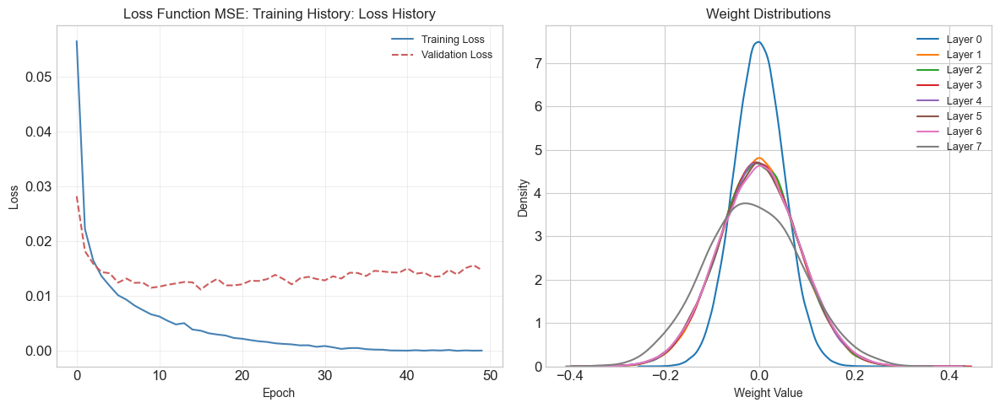

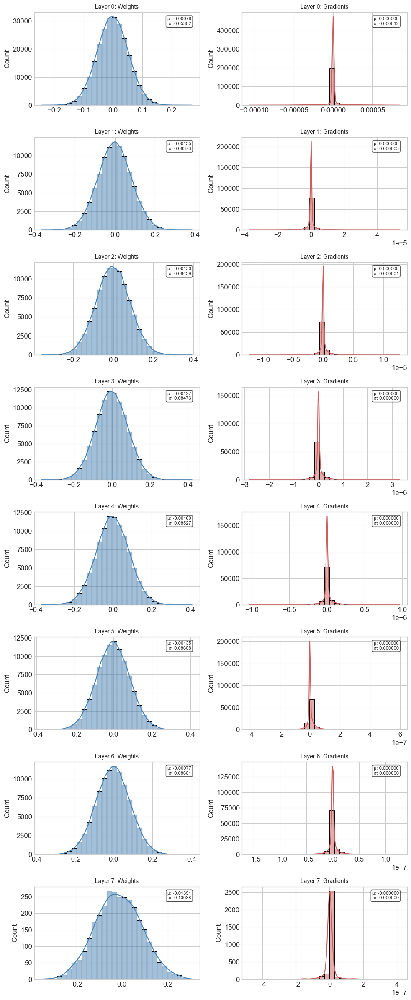

In [ ]:
trained_model_loss_mse, history_loss_mse, predictions_loss_mse, accuracy_loss_mse, results_loss_mse = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Loss Function MSE",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='mean_squared_error',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 2. Binary Categorical Entropy

$\text{BCE} = -\frac{1}{n} \sum_{i=1}^{n} \left[ y_{\text{true}, i} \log(y_{\text{pred}, i}) + (1 - y_{\text{true}, i}) \log(1 - y_{\text{pred}, i}) \right]$


Training Loss Function BCE model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: binary_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.2406 - val_loss: 0.2325oss: 0.2181
Epoch 2/50 - train_loss: 0.1911 - val_loss: 0.2338oss: 0.3873
Epoch 3/50 - train_loss: 1.0648 - val_loss: 3.3786oss: 2.3164
Epoch 4/50 - train_loss: 5.0843 - val_loss: 5.2319oss: 5.9115
Epoch 5/50 - train_loss: 5.8868 - val_loss: 6.1214oss: 6.2602
Epoch 6/50 - train_loss: 5.9224 - val_loss: 4.1092oss: 6.0090
Epoch 7/50 - train_loss: 6.0645 - val_loss: 6.2120oss: 6.2602
Epoch 8/50 - train_loss: 6.0948 - val_loss: 6.3601oss: 6.0444
Epoch 9/50 - train_loss: 6.1397 - val_loss: 6.2220oss: 5.8285
Epoch 10/50 - train_loss: 6.1818 - val_loss: 6.2017oss: 6.2602
Epoch 11/50 - train_loss: 6.1340 - val_loss: 6.0986oss: 5.82

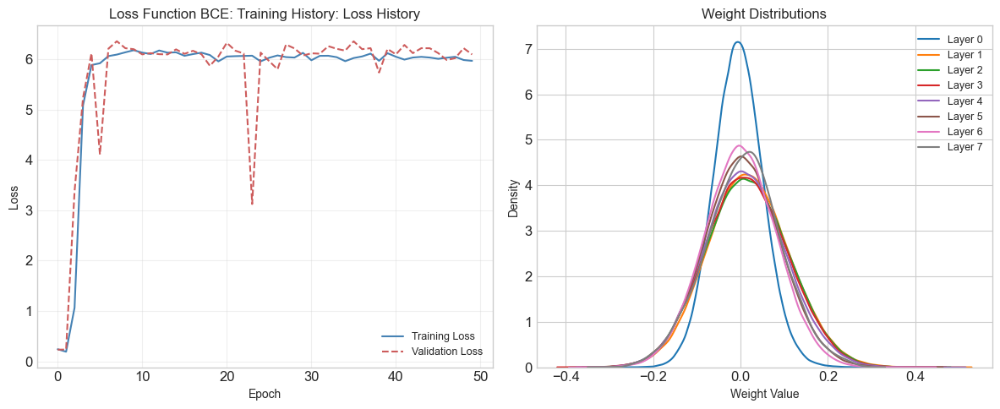

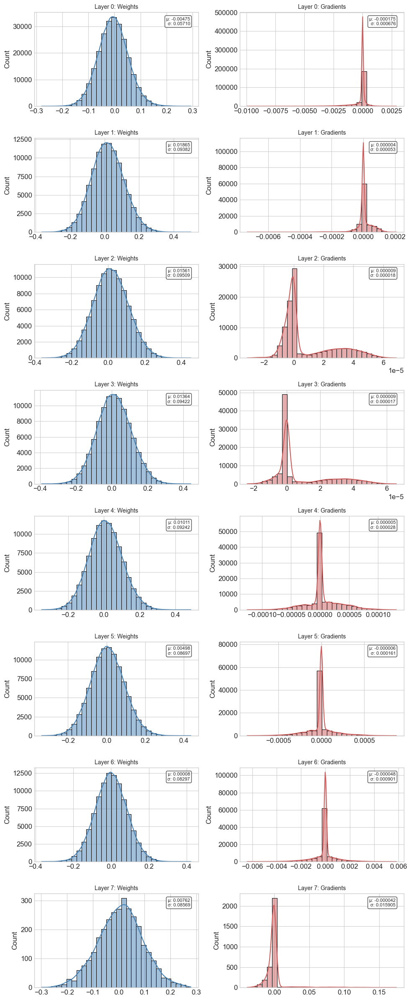

In [ ]:
trained_model_loss_bce, history_loss_bce, predictions_loss_bce, accuracy_loss_bce, results_loss_bce = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Loss Function BCE",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='binary_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 3. Cross Categorical Entropy

$\text{CCE} = -\frac{1}{n} \sum_{i=1}^{n} \sum_{j=1}^{C} y_{\text{true}, i, j} \log(y_{\text{pred}, i, j})$


Training Loss Function CCE model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3083 - val_loss: 0.5825oss: 0.4944
Epoch 2/50 - train_loss: 0.4658 - val_loss: 0.4225oss: 0.5743
Epoch 3/50 - train_loss: 0.3552 - val_loss: 0.3353oss: 0.5237
Epoch 4/50 - train_loss: 0.2961 - val_loss: 0.3103oss: 0.2576
Epoch 5/50 - train_loss: 0.2560 - val_loss: 0.2845oss: 0.1829
Epoch 6/50 - train_loss: 0.2255 - val_loss: 0.2676oss: 0.1877
Epoch 7/50 - train_loss: 0.2015 - val_loss: 0.2605oss: 0.0713
Epoch 8/50 - train_loss: 0.1771 - val_loss: 0.2737oss: 0.1907
Epoch 9/50 - train_loss: 0.1597 - val_loss: 0.2719oss: 0.3646
Epoch 10/50 - train_loss: 0.1432 - val_loss: 0.2582oss: 0.0378
Epoch 11/50 - train_loss: 0.1265 - val_loss: 0.2625oss:

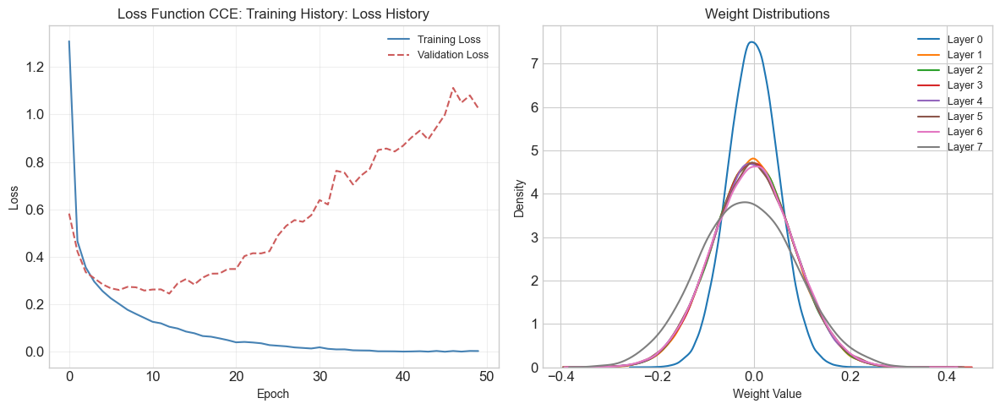

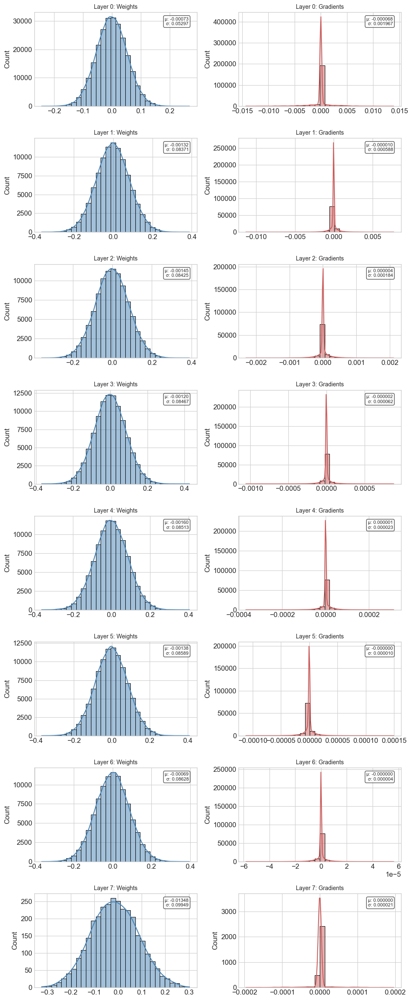

In [ ]:
trained_model_loss_cce, history_loss_cce, predictions_loss_cce, accuracy_loss_cce, results_loss_cce = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Loss Function CCE",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### Compare Loss Function

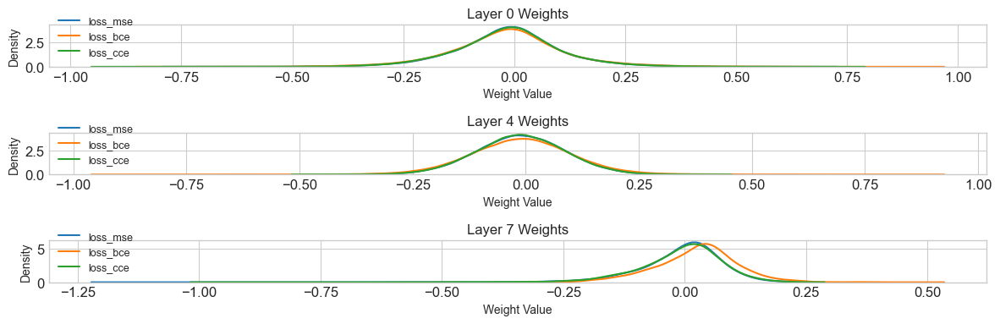

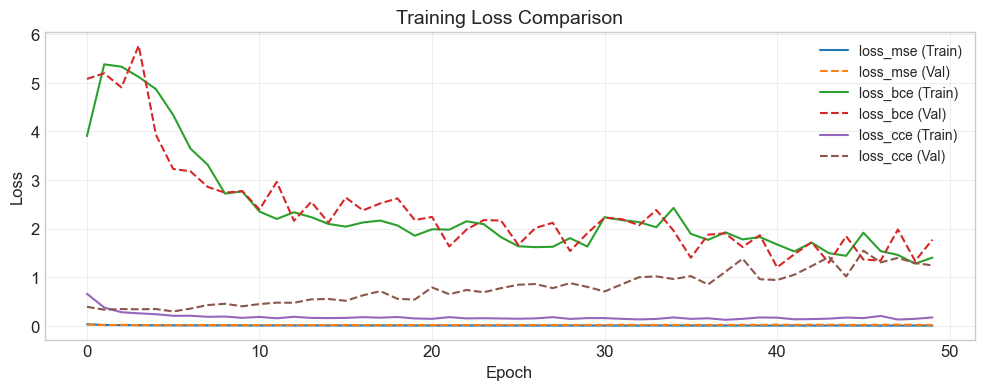

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "loss_mse": (trained_model_loss_mse, history_loss_mse, predictions_loss_mse, accuracy_loss_mse),
    "loss_bce": (trained_model_loss_bce, history_loss_bce, predictions_loss_bce, accuracy_loss_bce),
    "loss_cce": (trained_model_loss_cce, history_loss_cce, predictions_loss_cce, accuracy_loss_cce)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## I. Weight Initialization

- **Zero**: $W = 0$

- **Random Uniform**: $W \sim \mathcal{U}(a, b)$

- **Random Normal**: $W \sim \mathcal{N}(\mu, \sigma^2)$

- **Xavier**: $W \sim \mathcal{U}\left(-\sqrt{\frac{6}{n_{in} + n_{out}}}, \sqrt{\frac{6}{n_{in} + n_{out}}}\right)$

- **He**: $W \sim \mathcal{N}\left(0, \sqrt{\frac{2}{n_{in}}}\right)$

### 1. Zero


Training Weight Initialization Zero model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: zero
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.3025 - val_loss: 2.3025oss: 2.3027
Epoch 2/50 - train_loss: 2.3023 - val_loss: 2.3025oss: 2.3016
Epoch 3/50 - train_loss: 2.3022 - val_loss: 2.3024oss: 2.3020
Epoch 4/50 - train_loss: 2.3020 - val_loss: 2.3024oss: 2.3027
Epoch 5/50 - train_loss: 2.3019 - val_loss: 2.3023oss: 2.3040
Epoch 6/50 - train_loss: 2.3017 - val_loss: 2.3023oss: 2.3001
Epoch 7/50 - train_loss: 2.3016 - val_loss: 2.3023oss: 2.3000
Epoch 8/50 - train_loss: 2.3015 - val_loss: 2.3023oss: 2.3001
Epoch 9/50 - train_loss: 2.3014 - val_loss: 2.3023oss: 2.3031
Epoch 10/50 - train_loss: 2.3013 - val_loss: 2.3022oss: 2.3007
Epoch 11/50 - train_loss: 2.3012 - val_loss:

c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:34: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(weights, label=f"Layer {layer_idx}", ax=ax2)
c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:34: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(weights, label=f"Layer {layer_idx}", ax=ax2)
c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:34: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(weights, label=f"Layer {layer_idx}", ax=ax2)
c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:34:

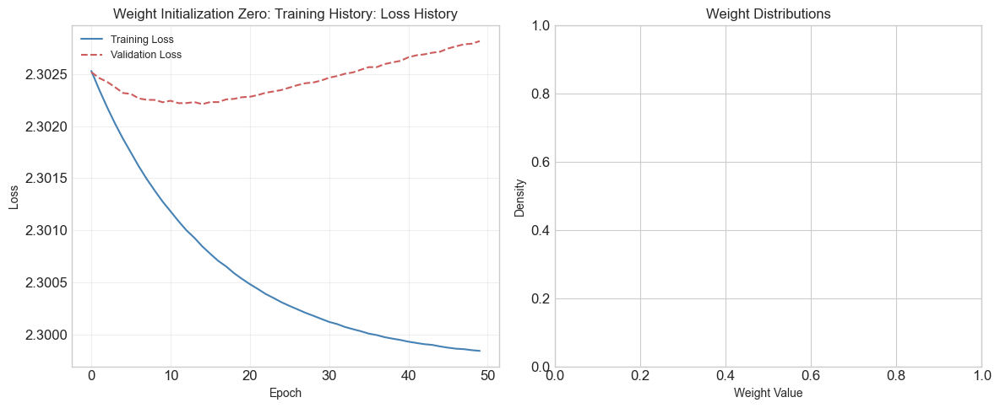

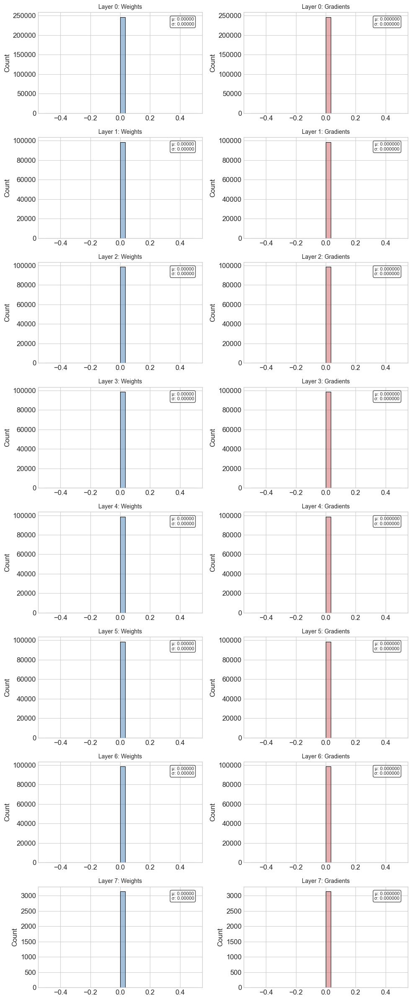

In [ ]:
trained_model_weight_zero, history_weight_zero, predictions_weight_zero, accuracy_weight_zero, results_weight_zero = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Zero",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='zero',
    regularization_type='none',
    normalization_type='none',
)

### 2. Random Uniform


Training Weight Initialization Random Uniform model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: random_uniform
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.7676 - val_loss: 1.0589oss: 1.4888
Epoch 2/50 - train_loss: 0.8133 - val_loss: 0.6696oss: 0.5632
Epoch 3/50 - train_loss: 0.5928 - val_loss: 0.5546oss: 0.2093
Epoch 4/50 - train_loss: 0.4664 - val_loss: 0.4695oss: 0.3818
Epoch 5/50 - train_loss: 0.3975 - val_loss: 0.4147oss: 0.5465
Epoch 6/50 - train_loss: 0.3501 - val_loss: 0.3940oss: 0.1776
Epoch 7/50 - train_loss: 0.3095 - val_loss: 0.3673oss: 0.3767
Epoch 8/50 - train_loss: 0.2848 - val_loss: 0.3305oss: 0.4662
Epoch 9/50 - train_loss: 0.2599 - val_loss: 0.3486oss: 0.2921
Epoch 10/50 - train_loss: 0.2422 - val_loss: 0.3295oss: 0.2115
Epoch 11/50 - train_loss

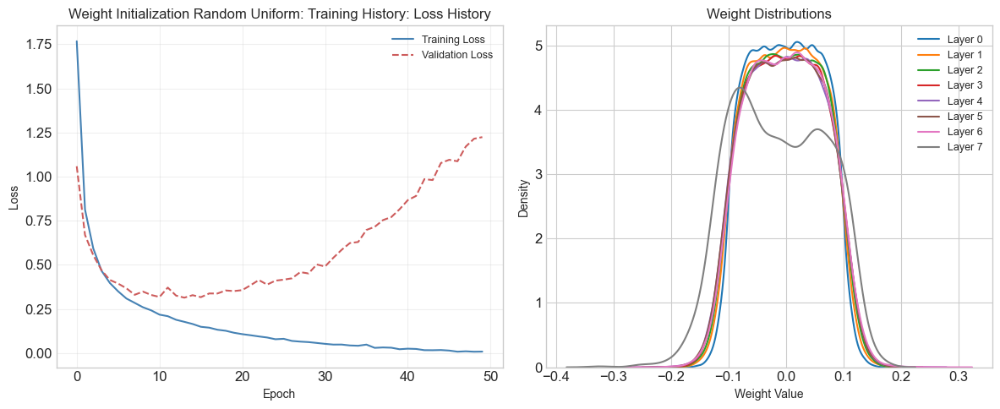

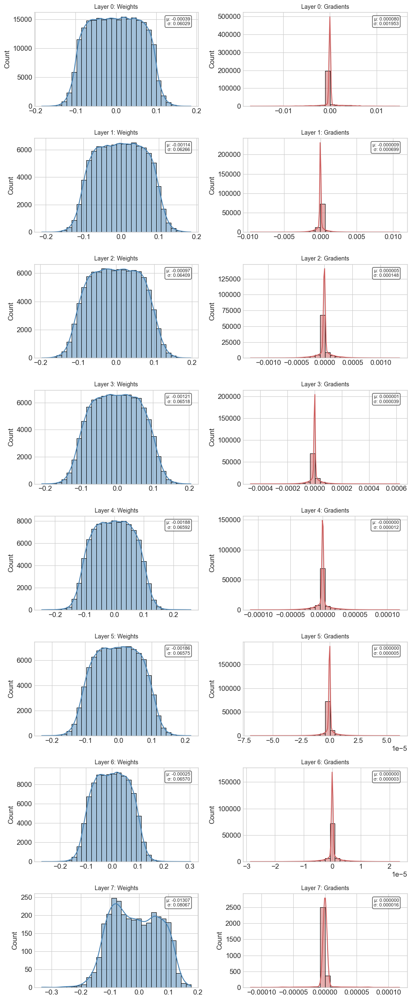

In [ ]:
trained_model_weight_random_uniform, history_weight_random_uniform, predictions_weight_random_uniform, accuracy_weight_random_uniform, results_weight_random_uniform = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Random Uniform",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='random_uniform',
    regularization_type='none',
    normalization_type='none'
)

### 3. Random Normal


Training Weight Initialization Random Normal model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: random_normal
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.6853 - val_loss: 0.7273oss: 0.6224
Epoch 2/50 - train_loss: 0.5953 - val_loss: 0.5178oss: 0.7679
Epoch 3/50 - train_loss: 0.4284 - val_loss: 0.4316oss: 0.4532
Epoch 4/50 - train_loss: 0.3514 - val_loss: 0.3951oss: 0.3719
Epoch 5/50 - train_loss: 0.2857 - val_loss: 0.3692oss: 0.4103
Epoch 6/50 - train_loss: 0.2472 - val_loss: 0.3523oss: 0.0892
Epoch 7/50 - train_loss: 0.2163 - val_loss: 0.3447oss: 0.2097
Epoch 8/50 - train_loss: 0.1843 - val_loss: 0.3413oss: 0.0643
Epoch 9/50 - train_loss: 0.1621 - val_loss: 0.3767oss: 0.0521
Epoch 10/50 - train_loss: 0.1460 - val_loss: 0.3493oss: 0.1170
Epoch 11/50 - train_loss: 

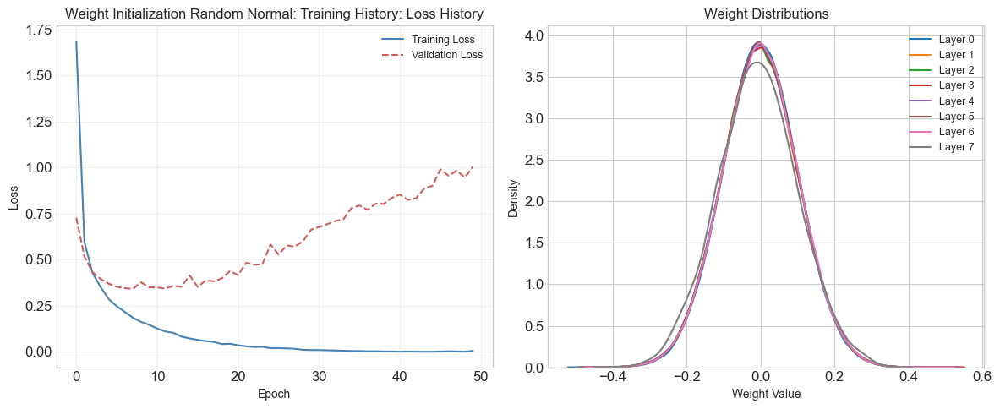

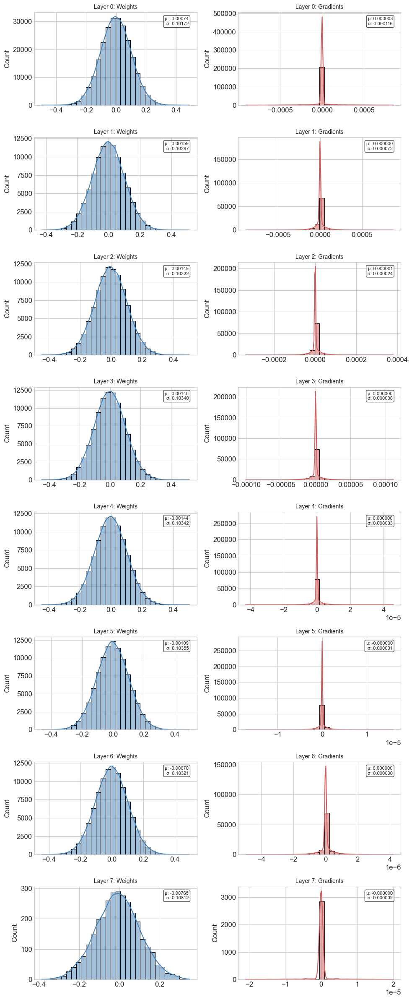

In [ ]:
trained_model_weight_random_normal, history_weight_random_normal, predictions_weight_random_normal, accuracy_weight_random_normal, results_weight_random_normal = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Random Normal",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='random_normal',
    regularization_type='none',
    normalization_type='none'
)

### 4. Xavier


Training Weight Initialization Xavier model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: xavier
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.7303 - val_loss: 1.0429oss: 0.9793
Epoch 2/50 - train_loss: 0.8032 - val_loss: 0.7015oss: 0.6071
Epoch 3/50 - train_loss: 0.6040 - val_loss: 0.5685oss: 0.2813
Epoch 4/50 - train_loss: 0.4828 - val_loss: 0.4588oss: 0.5321
Epoch 5/50 - train_loss: 0.4045 - val_loss: 0.4203oss: 0.3961
Epoch 6/50 - train_loss: 0.3490 - val_loss: 0.3816oss: 0.4174
Epoch 7/50 - train_loss: 0.3162 - val_loss: 0.3480oss: 0.2669
Epoch 8/50 - train_loss: 0.2823 - val_loss: 0.3532oss: 0.1325
Epoch 9/50 - train_loss: 0.2563 - val_loss: 0.3432oss: 0.1889
Epoch 10/50 - train_loss: 0.2378 - val_loss: 0.3186oss: 0.1418
Epoch 11/50 - train_loss: 0.2160 - val_l

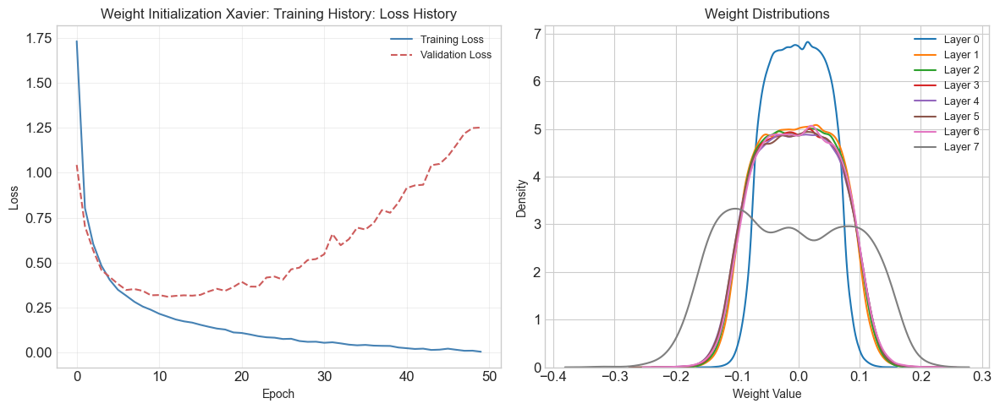

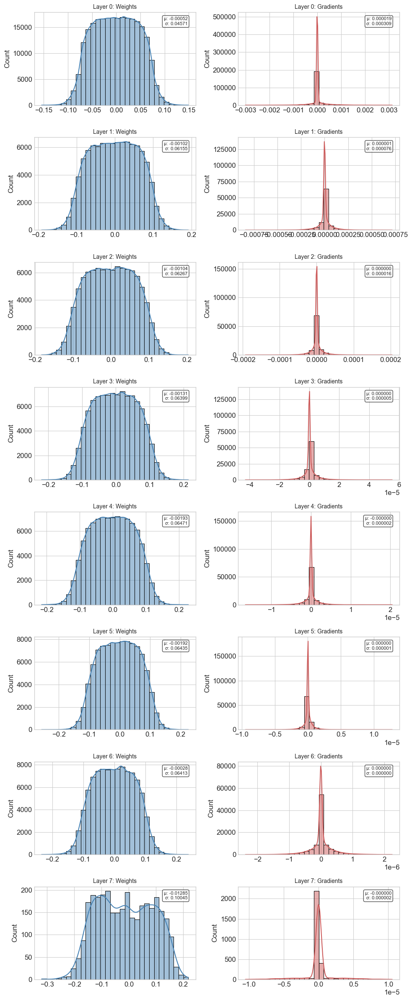

In [ ]:
trained_model_weight_xavier, history_weight_xavier, predictions_weight_xavier, accuracy_weight_xavier, results_weight_xavier = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Xavier",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='xavier',
    regularization_type='none',
    normalization_type='none'
)

### 5. He


Training Weight Initialization He model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3220 - val_loss: 0.6187oss: 0.6332
Epoch 2/50 - train_loss: 0.4767 - val_loss: 0.4235oss: 0.2660
Epoch 3/50 - train_loss: 0.3585 - val_loss: 0.3436oss: 0.5323
Epoch 4/50 - train_loss: 0.2987 - val_loss: 0.3325oss: 0.0951
Epoch 5/50 - train_loss: 0.2524 - val_loss: 0.2807oss: 0.3803
Epoch 6/50 - train_loss: 0.2249 - val_loss: 0.2659oss: 0.0515
Epoch 7/50 - train_loss: 0.1978 - val_loss: 0.2624oss: 0.1297
Epoch 8/50 - train_loss: 0.1769 - val_loss: 0.2914oss: 0.0581
Epoch 9/50 - train_loss: 0.1583 - val_loss: 0.2563oss: 0.0737
Epoch 10/50 - train_loss: 0.1423 - val_loss: 0.2803oss: 0.1181
Epoch 11/50 - train_loss: 0.1271 - val_loss: 0.2

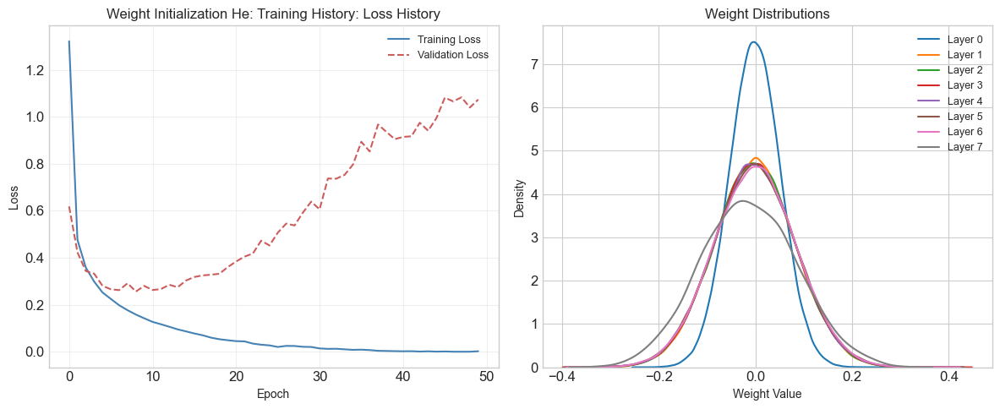

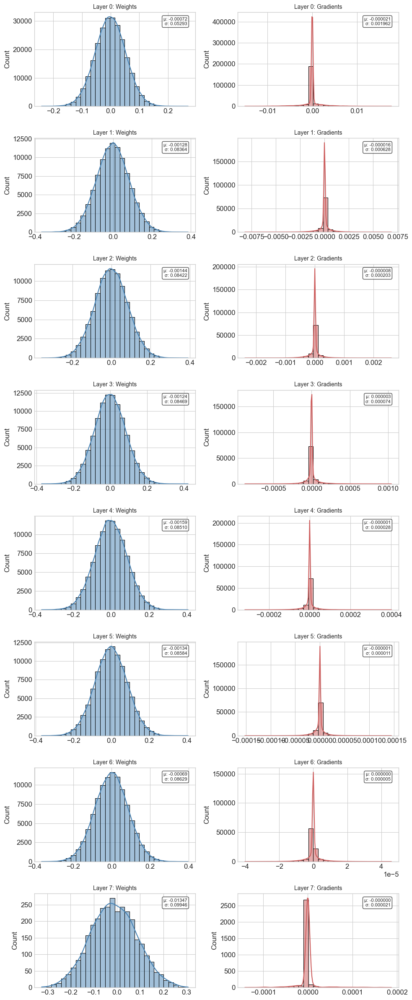

In [ ]:
trained_model_weight_he, history_weight_he, predictions_weight_he, accuracy_weight_he, results_weight_he = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization He",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### Compare Weight Initialization

c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:167: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(weights, ax=w_axs[i], label=name)
c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:167: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(weights, ax=w_axs[i], label=name)
c:\Users\NathanGalung\Documents\Kuliah\sem6\ml\Tubes\IF3270_TB1_K03_G27_CapCipCup\src\..\src\util\visualization.py:167: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(weights, ax=w_axs[i], label=name)


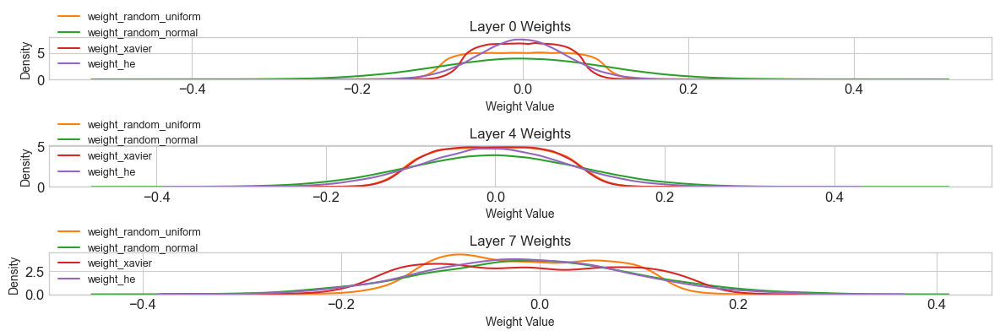

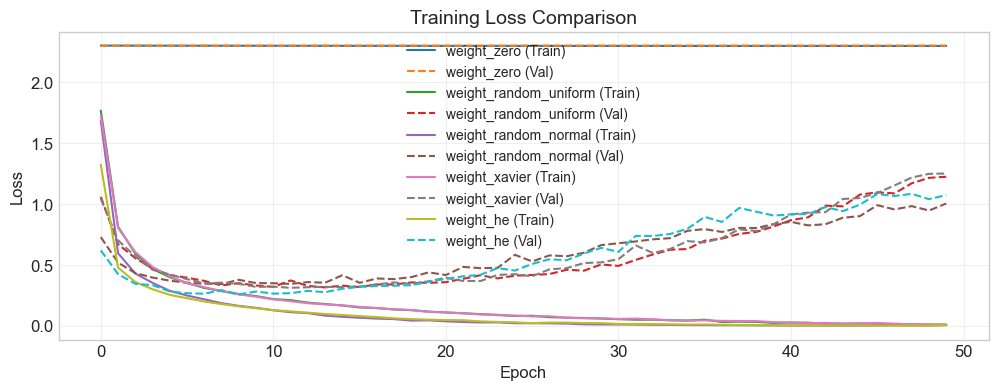

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "weight_zero": (trained_model_weight_zero, history_weight_zero, predictions_weight_zero, accuracy_weight_zero),
    "weight_random_uniform": (trained_model_weight_random_uniform, history_weight_random_uniform, predictions_weight_random_uniform, accuracy_weight_random_uniform),
    "weight_random_normal": (trained_model_weight_random_normal, history_weight_random_normal, predictions_weight_random_normal, accuracy_weight_random_normal),
    "weight_xavier": (trained_model_weight_xavier, history_weight_xavier, predictions_weight_xavier, accuracy_weight_xavier),
    "weight_he": (trained_model_weight_he, history_weight_he, predictions_weight_he, accuracy_weight_he)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## J. Regularization

- **None**

- **L1**: $L = L_0 + \lambda \sum_{i=1}^{n} |w_i|$ <br> **Gradient**: $\frac{\partial L}{\partial w_i} = \frac{\partial L_0}{\partial w_i} + \lambda \cdot \text{sign}(w_i)$

- **L2**: $L = L_0 + \lambda \sum_{i=1}^{n} w_i^2$ <br> **Gradient**: $\frac{\partial L}{\partial w_i} = \frac{\partial L_0}{\partial w_i} + 2\lambda w_i$


### 1.None


Training Regularization None model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3363 - val_loss: 0.6252oss: 0.8288
Epoch 2/50 - train_loss: 0.4743 - val_loss: 0.4071oss: 0.4592
Epoch 3/50 - train_loss: 0.3573 - val_loss: 0.3708oss: 0.1629
Epoch 4/50 - train_loss: 0.3030 - val_loss: 0.3108oss: 0.2119
Epoch 5/50 - train_loss: 0.2536 - val_loss: 0.2821oss: 0.2690
Epoch 6/50 - train_loss: 0.2263 - val_loss: 0.3017oss: 0.2856
Epoch 7/50 - train_loss: 0.1996 - val_loss: 0.2621oss: 0.2047
Epoch 8/50 - train_loss: 0.1769 - val_loss: 0.2566oss: 0.1019
Epoch 9/50 - train_loss: 0.1638 - val_loss: 0.2774oss: 0.0487
Epoch 10/50 - train_loss: 0.1411 - val_loss: 0.2598oss: 0.2387
Epoch 11/50 - train_loss: 0.1277 - val_loss: 0.2504os

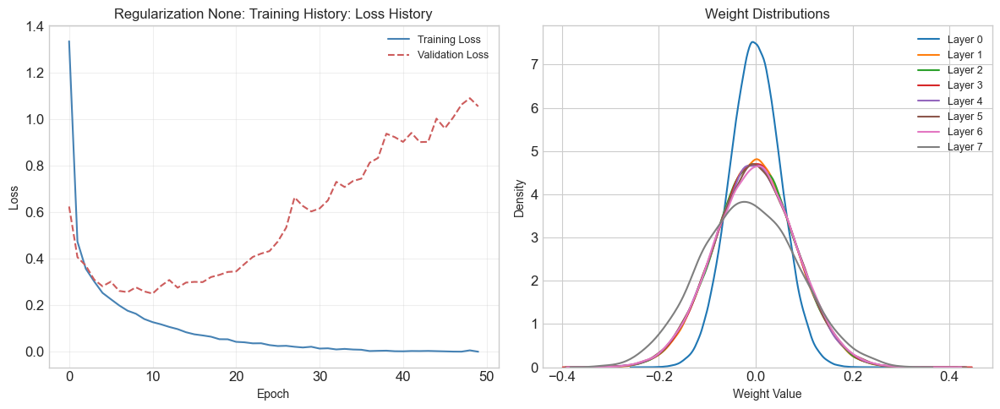

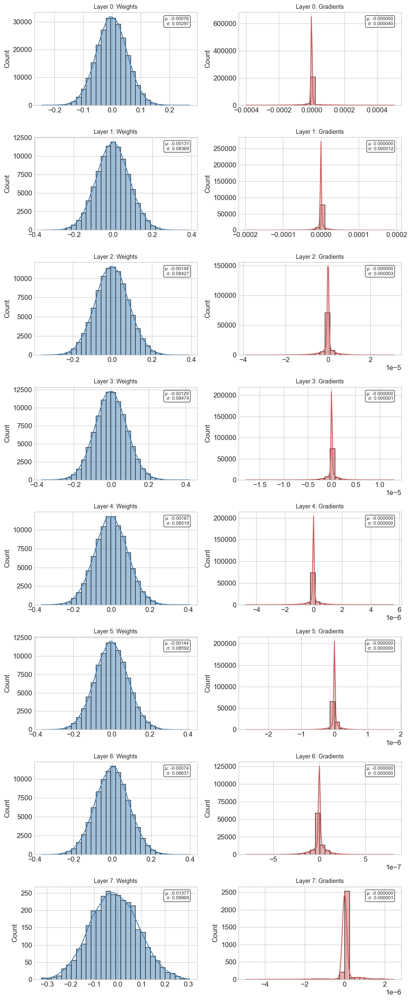

In [ ]:
trained_model_regularize_none, history_regularize_none, predictions_regularize_none, accuracy_regularize_none, results_regularize_none = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Regularization None",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

### 2. L1


Training Regularization L1 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Regularize: l1
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3175 - val_loss: 0.5851oss: 0.9889
Epoch 2/50 - train_loss: 0.4745 - val_loss: 0.4040oss: 0.3150
Epoch 3/50 - train_loss: 0.3526 - val_loss: 0.3368oss: 0.3269
Epoch 4/50 - train_loss: 0.2946 - val_loss: 0.3273oss: 0.5000
Epoch 5/50 - train_loss: 0.2490 - val_loss: 0.2968oss: 0.4492
Epoch 6/50 - train_loss: 0.2208 - val_loss: 0.2742oss: 0.0564
Epoch 7/50 - train_loss: 0.1953 - val_loss: 0.2686oss: 0.3006
Epoch 8/50 - train_loss: 0.1774 - val_loss: 0.2659oss: 0.1295
Epoch 9/50 - train_loss: 0.1602 - val_loss: 0.2616oss: 0.3926
Epoch 10/50 - train_loss: 0.1416 - val_loss: 0.2593oss: 0.0925
Epoch 11/50 - train_loss: 0.1248 - val_l

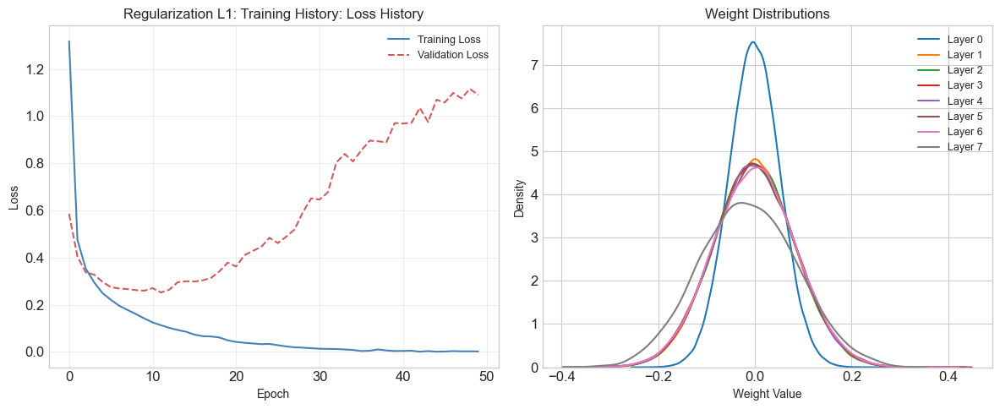

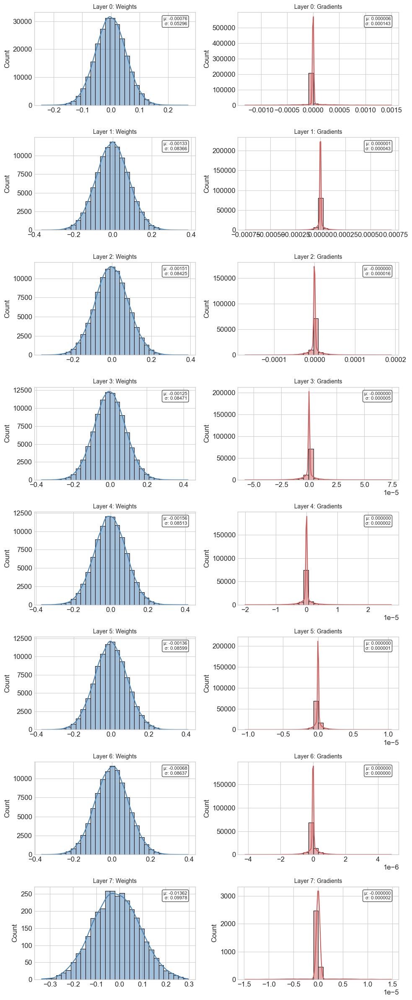

In [ ]:
trained_model_regularize_l1, history_regularize_l1, predictions_regularize_l1, accuracy_regularize_l1, results_regularize_l1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Regularization L1",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='l1',
    normalization_type='none'
)

### 3. L2


Training Regularization L2 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Regularize: l2
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3271 - val_loss: 0.5987oss: 0.5839
Epoch 2/50 - train_loss: 0.4729 - val_loss: 0.3958oss: 0.4223
Epoch 3/50 - train_loss: 0.3520 - val_loss: 0.3465oss: 0.3433
Epoch 4/50 - train_loss: 0.2983 - val_loss: 0.3101oss: 0.4811
Epoch 5/50 - train_loss: 0.2539 - val_loss: 0.2831oss: 0.1386
Epoch 6/50 - train_loss: 0.2228 - val_loss: 0.2893oss: 0.2294
Epoch 7/50 - train_loss: 0.1995 - val_loss: 0.2747oss: 0.3724
Epoch 8/50 - train_loss: 0.1775 - val_loss: 0.2601oss: 0.2663
Epoch 9/50 - train_loss: 0.1619 - val_loss: 0.2648oss: 0.0977
Epoch 10/50 - train_loss: 0.1445 - val_loss: 0.2714oss: 0.2149
Epoch 11/50 - train_loss: 0.1331 - val_l

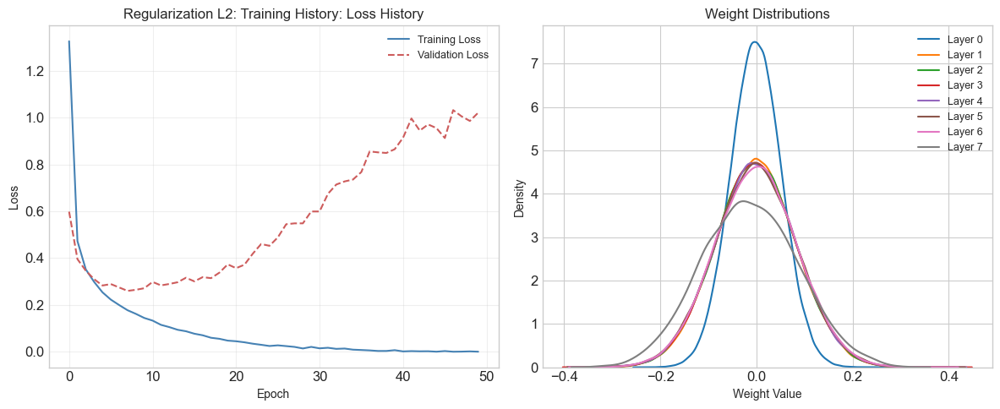

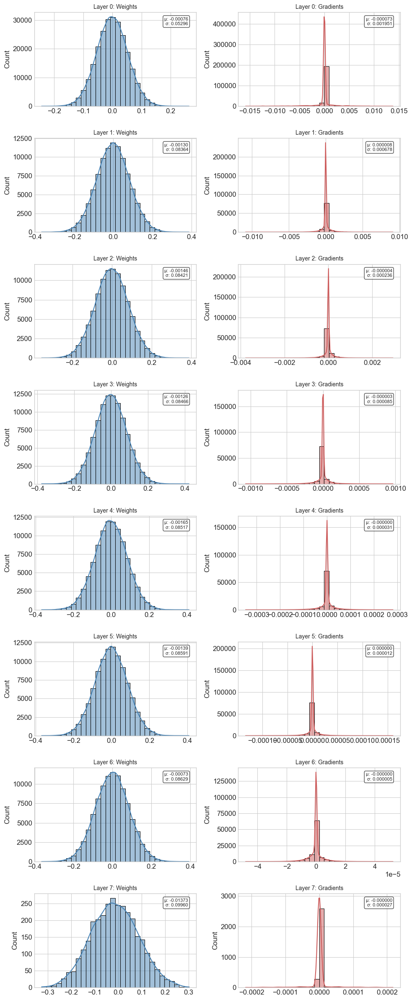

In [ ]:
trained_model_regularize_l2, history_regularize_l2, predictions_regularize_l2, accuracy_regularize_l2, results_regularize_l2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Regularization L2",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='l2',
    normalization_type='none'
)

### Compare Regularization

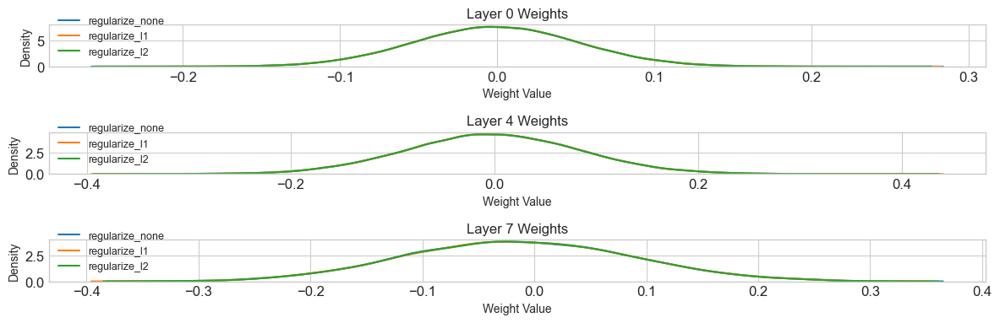

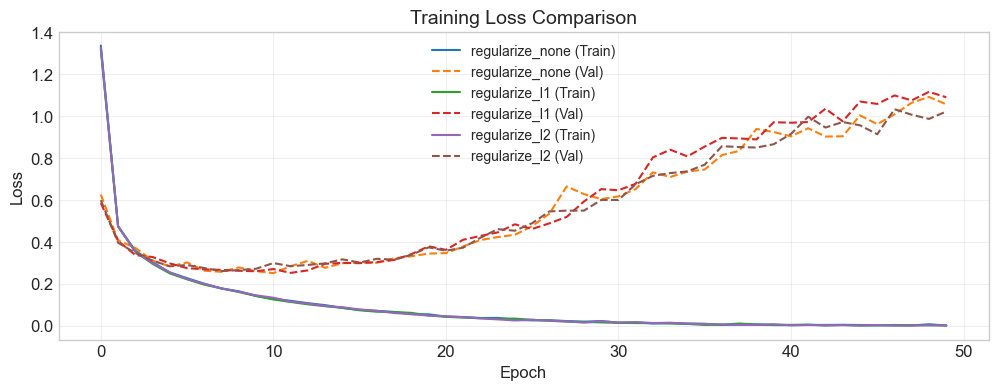

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "regularize_none": (trained_model_regularize_none, history_regularize_none, predictions_regularize_none, accuracy_regularize_none),
    "regularize_l1": (trained_model_regularize_l1, history_regularize_l1, predictions_regularize_l1, accuracy_regularize_l1),
    "regularize_l2": (trained_model_regularize_l2, history_regularize_l2, predictions_regularize_l2, accuracy_regularize_l2)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## K. Normalization

- **None**

- **RMS**: $\hat{x} = \frac{x}{\sqrt{\frac{1}{n}\sum_{i=1}^{n} x_i^2 + \epsilon}} \cdot \gamma$

### 1. None


Training Normalization None model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.3294 - val_loss: 0.6177oss: 0.6543
Epoch 2/50 - train_loss: 0.4752 - val_loss: 0.4114oss: 0.2403
Epoch 3/50 - train_loss: 0.3506 - val_loss: 0.3439oss: 0.3276
Epoch 4/50 - train_loss: 0.2963 - val_loss: 0.3256oss: 0.5229
Epoch 5/50 - train_loss: 0.2515 - val_loss: 0.2838oss: 0.1716
Epoch 6/50 - train_loss: 0.2224 - val_loss: 0.2840oss: 0.1216
Epoch 7/50 - train_loss: 0.1960 - val_loss: 0.2687oss: 0.1739
Epoch 8/50 - train_loss: 0.1764 - val_loss: 0.2756oss: 0.2643
Epoch 9/50 - train_loss: 0.1598 - val_loss: 0.2668oss: 0.1013
Epoch 10/50 - train_loss: 0.1392 - val_loss: 0.2689oss: 0.2670
Epoch 11/50 - train_loss: 0.1280 - val_loss: 0.2884oss

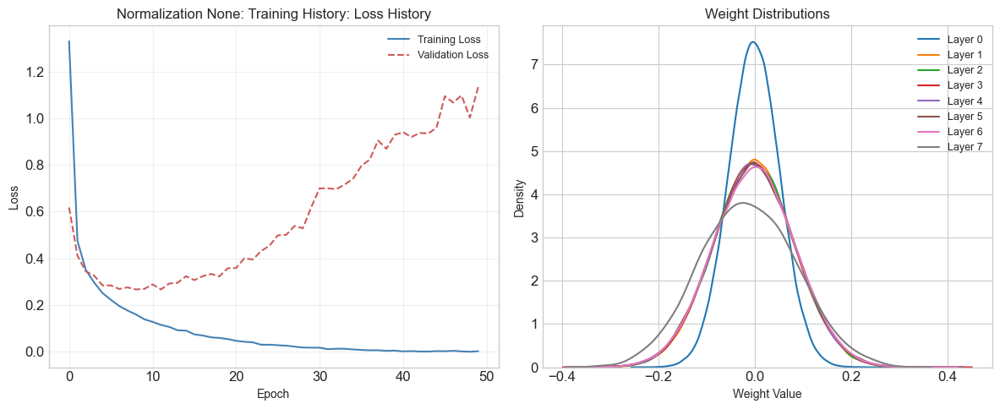

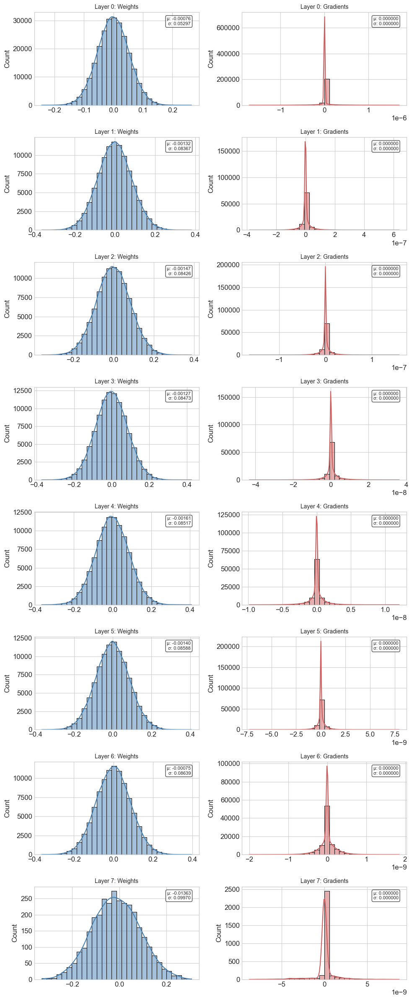

In [ ]:
trained_model_normalize_none, history_normalize_none, predictions_normalize_none, accuracy_normalize_none, results_normalize_none = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Normalization None",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 2. RMS


Training Normalization RMS model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Normalize: rms
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.2142 - val_loss: 0.7013oss: 0.6267
Epoch 2/50 - train_loss: 0.5209 - val_loss: 0.4994oss: 0.7037
Epoch 3/50 - train_loss: 0.3883 - val_loss: 0.4089oss: 0.2985
Epoch 4/50 - train_loss: 0.3136 - val_loss: 0.3655oss: 0.5150
Epoch 5/50 - train_loss: 0.2621 - val_loss: 0.3477oss: 0.4095
Epoch 6/50 - train_loss: 0.2226 - val_loss: 0.3410oss: 0.2662
Epoch 7/50 - train_loss: 0.1948 - val_loss: 0.3442oss: 0.0349
Epoch 8/50 - train_loss: 0.1678 - val_loss: 0.3392oss: 0.0987
Epoch 9/50 - train_loss: 0.1465 - val_loss: 0.3343oss: 0.4506
Epoch 10/50 - train_loss: 0.1276 - val_loss: 0.3290oss: 0.0789
Epoch 11/50 - train_loss: 0.1069 - val_l

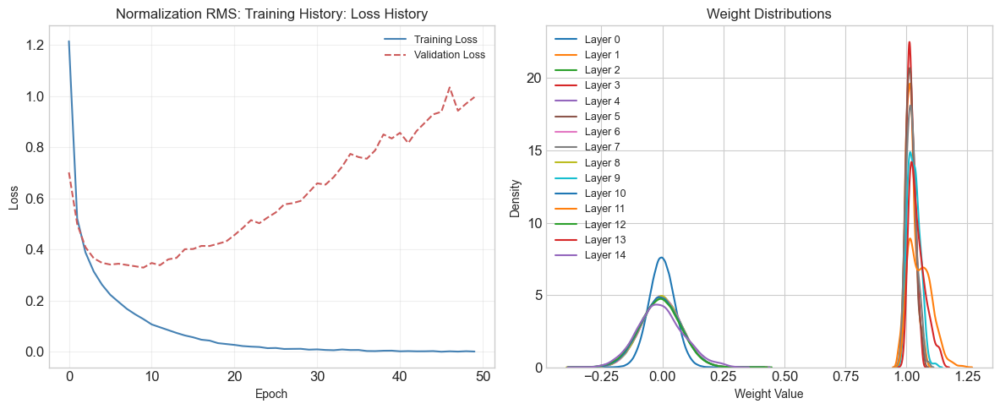

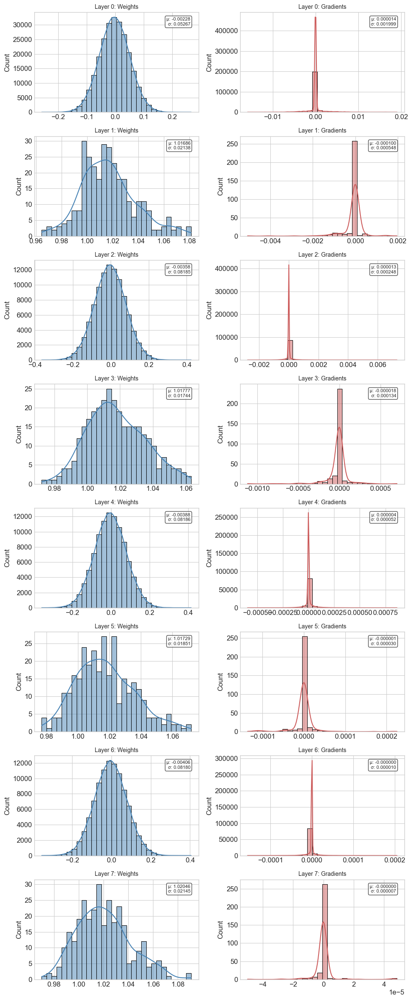

In [ ]:
trained_model_normalize_rms, history_normalize_rms, predictions_normalize_rms, accuracy_normalize_rms, results_normalize_rms = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Normalization RMS",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='rms'
)

### Compare Normalization

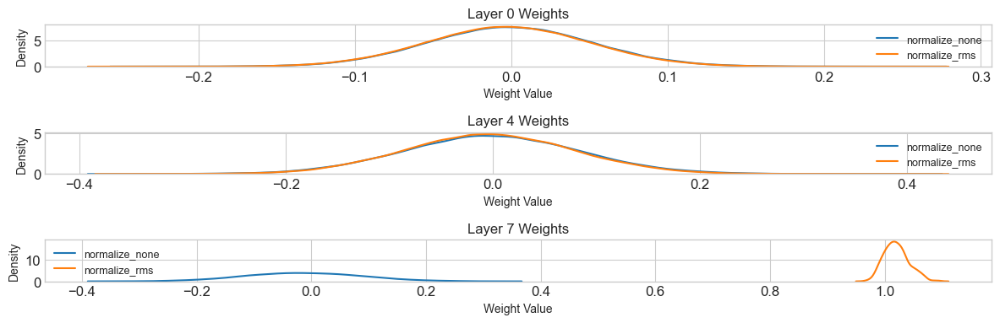

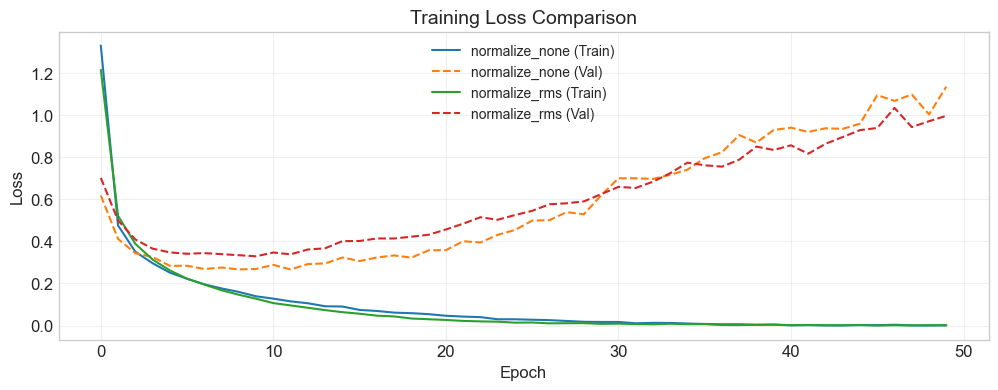

<Figure size 1200x800 with 0 Axes>

In [ ]:
models_dict = {
    "normalize_none": (trained_model_normalize_none, history_normalize_none, predictions_normalize_none, accuracy_normalize_none),
    "normalize_rms": (trained_model_normalize_rms, history_normalize_rms, predictions_normalize_rms, accuracy_normalize_rms)
}

loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## L. Final Comparison with MLP

- **CapCipCup Scratch**

- **MLP Library**

### 1. CapCipCup Scratch


Training CapCipCup Neural Network model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Using learning rate scheduler: initial_lr=0.0001, decay_rate=0.9, decay_steps=5
Training model with learning_rate=0.0001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 0.4898 - val_loss: 0.2701oss: 0.2914
Epoch 2/50 - train_loss: 0.2241 - val_loss: 0.2144oss: 0.1037
Epoch 3/50 - train_loss: 0.1872 - val_loss: 0.2099oss: 0.1683
Epoch 4/50 - train_loss: 0.1663 - val_loss: 0.1879oss: 0.0408
Epoch 5/50 - train_loss: 0.1513 - val_loss: 0.1801oss: 0.1148
Epoch 6/50 - train_loss: 0.1400 - val_loss: 0.1889oss: 0.0522
Epoch 7/50 - train_loss: 0.1330 - val_loss: 0.1783oss: 0.0691
Epoch 8/50 - train_loss: 0.1258 - val_loss: 0.1814oss: 0.2311
Epoch 9/50 - train_loss: 0.1203 - val_loss: 0.1833oss: 0.0576
Epoch 10/50 - train_loss: 0.1168 - val_loss: 0.1866oss: 0.2598
Epoch 11/50 - train_loss: 0.1110 - val_loss: 0.1

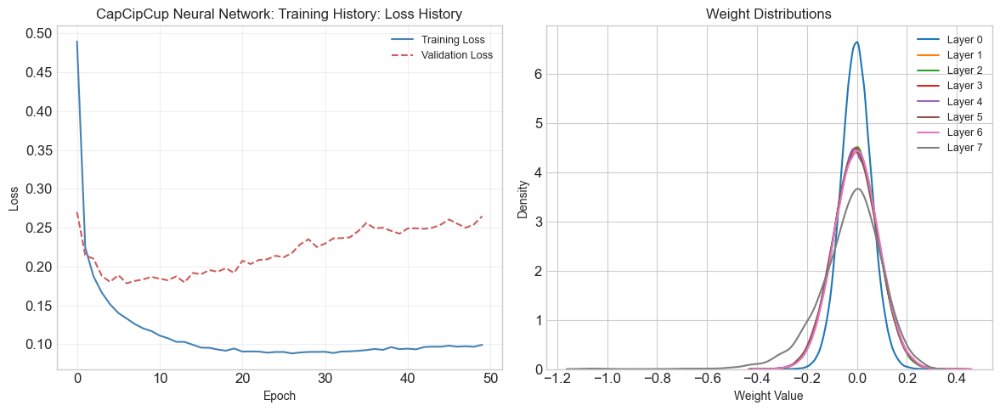

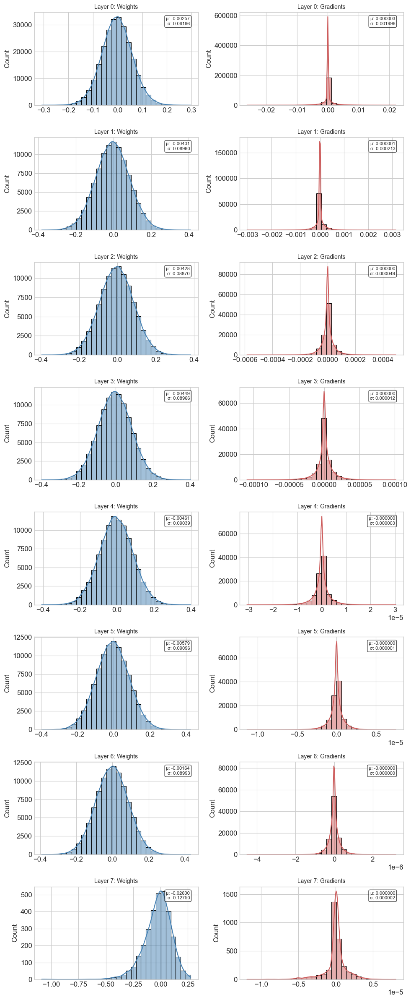


CapCipCup Neural Network Results:
Test Accuracy: 0.9389


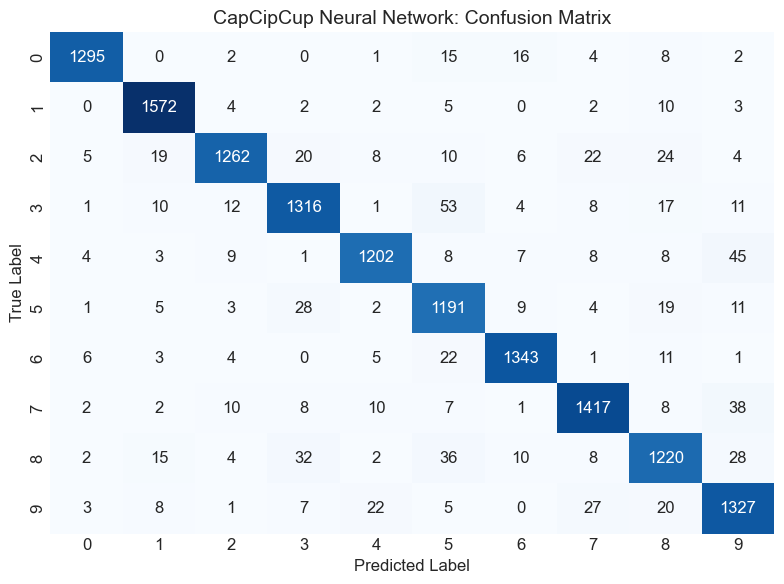

In [15]:
trained_model_capcipcup, history_capcipcup, predictions_capcipcup, accuracy_capcipcup, results_capcipcup = run_hyperparameter(
    X_train, X_test, y_train, y_test,
    name="CapCipCup Neural Network",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
    batch_size=64,
    epochs=50
)

print("\nCapCipCup Neural Network Results:")
print(f"Test Accuracy: {accuracy_capcipcup:.4f}")

plt.figure(figsize=(8, 6))
cm = results_capcipcup["confusion_matrix"]
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title("CapCipCup Neural Network: Confusion Matrix", fontsize=14)
plt.ylabel("True Label", fontsize=12)
plt.xlabel("Predicted Label", fontsize=12)
plt.tight_layout()
plt.show()

### 2. MLP Library

Training scikit-learn MLPClassifier model...
Architecture: 7 hidden layers of 314 neurons each
Activation: relu, Learning rate: 0.001, Max iterations: 50
Iteration 1, loss = 0.66362539
Iteration 2, loss = 0.19142775
Iteration 3, loss = 0.13695419
Iteration 4, loss = 0.10661596
Iteration 5, loss = 0.08382874
Iteration 6, loss = 0.06860963
Iteration 7, loss = 0.05660638
Iteration 8, loss = 0.04572015
Iteration 9, loss = 0.03819626
Iteration 10, loss = 0.03043652
Iteration 11, loss = 0.02568038
Iteration 12, loss = 0.01975689
Iteration 13, loss = 0.01566179
Iteration 14, loss = 0.01298957
Iteration 15, loss = 0.01231839
Iteration 16, loss = 0.01514290
Iteration 17, loss = 0.00876089
Iteration 18, loss = 0.01052746
Iteration 19, loss = 0.00759793
Iteration 20, loss = 0.00813334
Iteration 21, loss = 0.00744228
Iteration 22, loss = 0.00269686
Iteration 23, loss = 0.00866145
Iteration 24, loss = 0.00946215
Iteration 25, loss = 0.00272811
Iteration 26, loss = 0.00350970
Iteration 27, loss = 0.

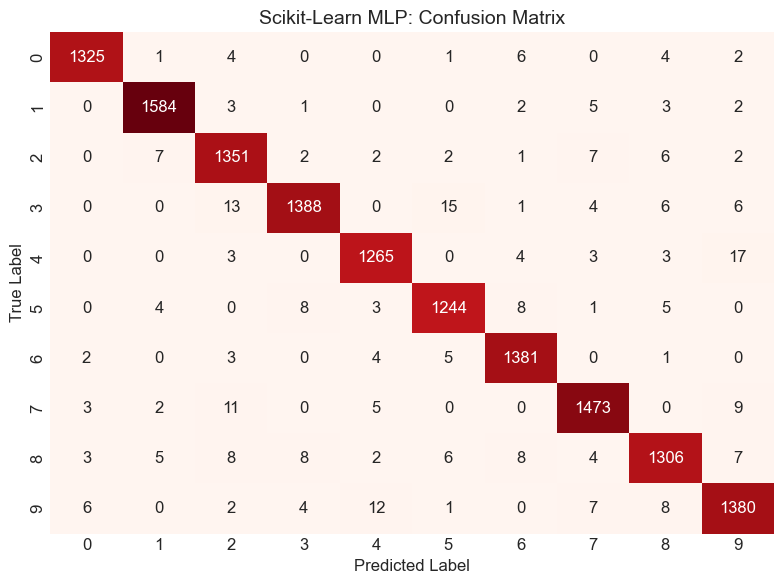

In [ ]:
print("Training scikit-learn MLPClassifier model...")
print(f"Architecture: 7 hidden layers of 314 neurons each")
print(f"Activation: relu, Learning rate: 0.0001, Max iterations: 50")

start_time = time.time()

mlp_model = MLPClassifier(
    hidden_layer_sizes=(314, 314, 314, 314, 314, 314, 314),
    activation='relu',
    solver='adam',
    alpha=0.0001,
    learning_rate_init=0.0001, 
    max_iter=50,
    random_state=42, 
    verbose=True
)

mlp_model.fit(X_train, np.argmax(y_train, axis=1))

training_time = time.time() - start_time

mlp_predictions_proba = mlp_model.predict_proba(X_test)
mlp_predictions = mlp_model.predict(X_test)
mlp_accuracy = mlp_model.score(X_test, np.argmax(y_test, axis=1))

print(f"\nTraining completed in {training_time:.2f} seconds")
print(f"Test accuracy: {mlp_accuracy:.4f}")

mlp_history = {
    "train_loss": mlp_model.loss_curve_,
}

mlp_predictions_one_hot = np.zeros_like(y_test)
for i, pred_idx in enumerate(mlp_predictions):
    mlp_predictions_one_hot[i, pred_idx] = 1

mlp_cm = confusion_matrix(np.argmax(y_test, axis=1), mlp_predictions)

mlp_results = {
    "model": mlp_model,
    "history": mlp_history,
    "predictions": mlp_predictions_one_hot,
    "accuracy": mlp_accuracy,
    "confusion_matrix": mlp_cm,
    "training_time": training_time
}

plt.figure(figsize=(8, 6))
sns.heatmap(mlp_cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title("Scikit-Learn MLP: Confusion Matrix", fontsize=14)
plt.ylabel("True Label", fontsize=12)
plt.xlabel("Predicted Label", fontsize=12)
plt.tight_layout()
plt.show()

### Compare CapCipCup Scratch vs MLP Library

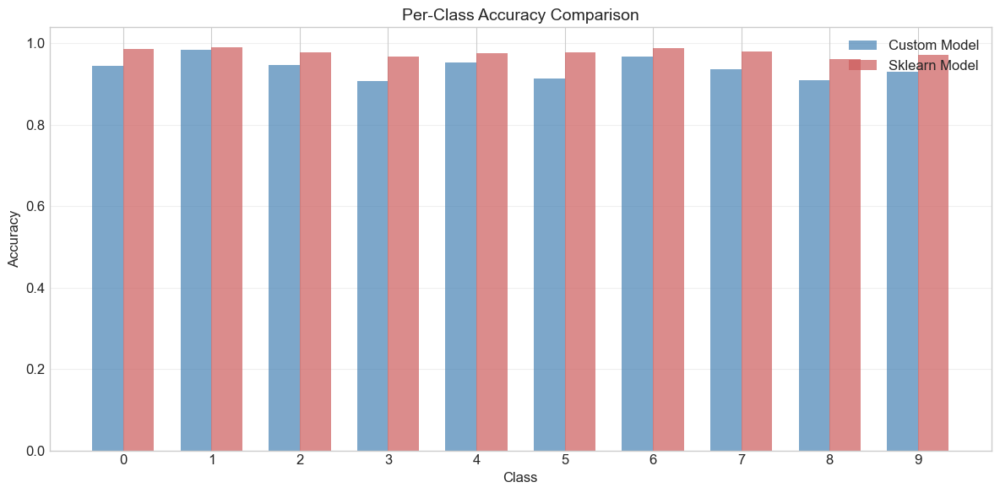

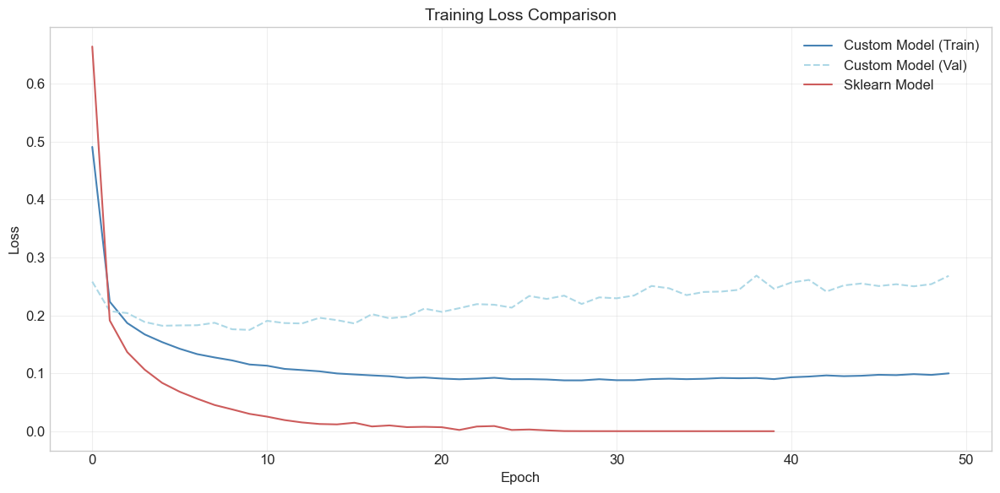

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare models
comparison_figures, summary = compare_per_class_accuracy(
    custom_model=trained_model_capcipcup,
    sklearn_model=mlp_model,
    X_test=X_test,
    y_test=y_test,
    custom_history=history_capcipcup,
    sklearn_history={'loss': mlp_model.loss_curve_} if hasattr(mlp_model, 'loss_curve_') else None,
    custom_preds=predictions_capcipcup
)

# Display all figures
for fig_name, fig in comparison_figures.items():
    plt.figure(fig.number)
    plt.show()

## M. Save and Load Final CapCipCup Model

- **Save Model**

- **Load Model**

### 1. Save Model

In [16]:
os.makedirs("../model", exist_ok=True)

trained_model_capcipcup.save("../model/capcipcup_model.pkl")
print("Model saved to ../model/capcipcup_model.pkl")

with open("../model/capcipcup_history.pkl", "wb") as f:
    pickle.dump(history_capcipcup, f)
print("Training history saved")

Model saved to ../model/capcipcup_model.pkl
Model saved to ../model/capcipcup_model.pkl
Training history saved


### 2. Load Model

In [ ]:
trained_model_capcipcup.load("../model/capcipcup_model.pkl")
trained_model_capcipcup.summary()

Model loaded from ../model/capcipcup_model.pkl

Neural Network Summary:
Layer (type)                  Output Shape        Param #        Trainable 
DenseLayer (0)                (None, 314)         246490         Yes       
DenseLayer (1)                (None, 314)         98910          Yes       
DenseLayer (2)                (None, 314)         98910          Yes       
DenseLayer (3)                (None, 314)         98910          Yes       
DenseLayer (4)                (None, 314)         98910          Yes       
DenseLayer (5)                (None, 314)         98910          Yes       
DenseLayer (6)                (None, 314)         98910          Yes       
DenseLayer (7)                (None, 10)          3150           Yes       
Total params: 843,100
Trainable params: 843,100
Non-trainable params: 0
